# Import

In [1]:
import datetime as dt
import numpy as np
from pathlib import Path
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
from dateutil.relativedelta import relativedelta
import cartopy.crs as ccrs
import scipy as sp
import itertools
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import ListedColormap
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression, CCA, PLSSVD
import pandas as pd
import pymannkendall as mk
import seaborn as sns
from scipy.stats import gaussian_kde
from xmca.xarray import xMCA
from scipy.stats import linregress
from collections import defaultdict
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
from scipy.signal import detrend as scipy_detrend
from sklearn.linear_model import LinearRegression
import regionmask
from sklearn.model_selection import KFold
from scipy.stats import pearsonr
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.base import clone
from sklearn.metrics import make_scorer
import os
import statsmodels.api as sm

# Load

In [2]:
ds = xr.open_dataset('data/spi3_cmap_1x1.nc')
spi = ds.rename_vars({list(ds.data_vars)[0]: 'spi'}).sortby('T').spi

spi = spi.rename({'X': 'lon','Y':'lat', 'T':'time'})

spi = spi.sel(time=slice('1981-01-01', '2020-12-31'))

mask = regionmask.defined_regions.natural_earth_v5_0_0.land_110.mask(
    spi['lon'], spi['lat']
)

# Fig1 - Trend

In [3]:
def mk_test(x):
    x = x[~np.isnan(x)]
    if len(x) < 3:
        return np.array([np.nan, np.nan])
    result = mk.original_test(x)
    trend_value = result.slope  # numeric trend (Sen's slope)
    sig = int(result.p <= 0.10)
    return np.array([trend_value, sig])

In [4]:
month_to_season = {
    1: 'NDJ', 2: 'DJF', 3: 'JFM', 4: 'FMA',
    5: 'MAM', 6: 'AMJ', 7: 'MJJ', 8: 'JJA',
    9: 'JAS', 10: 'ASO', 11: 'SON', 12: 'OND'
}


In [5]:
months = np.arange(1, 13)
season_labels = [month_to_season[m] for m in months]

trend_list = []
sig_list = []

for month in months:
    print(f"Processing month {month} : {month_to_season[month]}")

    spi_pre = spi.sel(time=slice('1981-01-01', '2000-12-31'))
    spi_post = spi.sel(time=slice('2001-01-01', '2020-12-31'))
    
    spi_month = spi.sel(time=spi['time'].dt.month == month)
    
    trend_sig = xr.apply_ufunc(
        mk_test,
        spi_month,
        input_core_dims=[['time']],
        output_core_dims=[['metric']],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )
    
    trend = trend_sig.sel(metric=0)
    sig = trend_sig.sel(metric=1)
    
    trend_list.append(trend)
    sig_list.append(sig)


Processing month 1 : NDJ
Processing month 2 : DJF
Processing month 3 : JFM
Processing month 4 : FMA
Processing month 5 : MAM
Processing month 6 : AMJ
Processing month 7 : MJJ
Processing month 8 : JJA
Processing month 9 : JAS
Processing month 10 : ASO
Processing month 11 : SON
Processing month 12 : OND


In [6]:
trend_seasonal = xr.concat(trend_list, dim='season')
sig_seasonal = xr.concat(sig_list, dim='season')
trend_seasonal['season'] = season_labels
sig_seasonal['season'] = season_labels

selected_seasons = ['OND', 'NDJ', 'DJF', 'JFM', 'FMA', 'MAM']
trend_subset = trend_seasonal.sel(season=selected_seasons)
sig_subset = sig_seasonal.sel(season=selected_seasons)


C:\Users\emile\AppData\Local\Temp\ipykernel_31248\3788563530.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  brbg = cm.get_cmap('BrBG', 256)
C:\Users\emile\AppData\Local\Temp\ipykernel_31248\3788563530.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  brbg = cm.get_cmap('BrBG', 256)
C:\Users\emile\AppData\Local\Temp\ipykernel_31248\3788563530.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  brbg = cm.get_cmap('BrBG', 256)
C:\Users\emile\AppData\Local

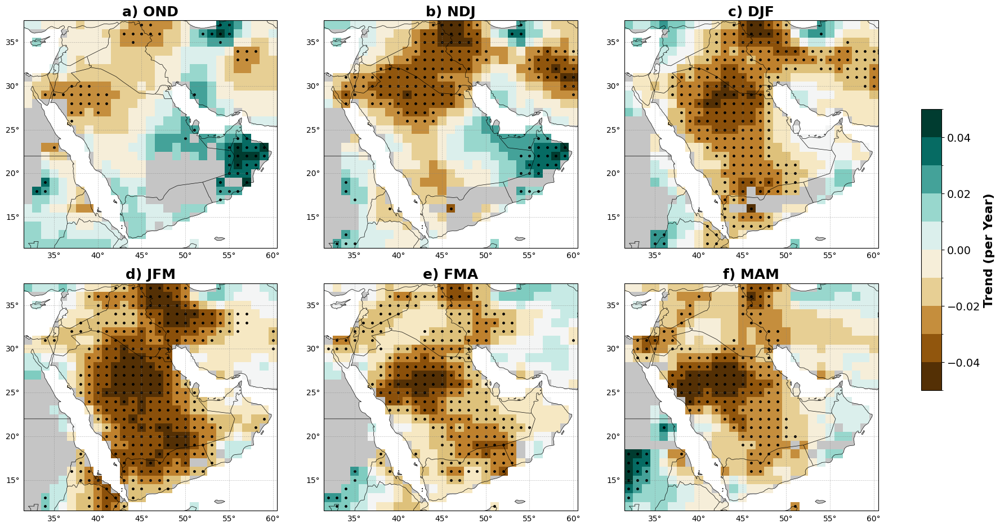

In [7]:

fig, axes = plt.subplots(2, 3, figsize=(18, 10),
                         subplot_kw={'projection': ccrs.PlateCarree()})

axes = axes.flatten()

# Labels to prefix the season titles
labels = ['a)', 'b)', 'c)', 'd)', 'e)', 'f)']

for i, ax in enumerate(axes):
    if i < len(selected_seasons):
        season = selected_seasons[i]
        tr = trend_subset.sel(season=season)
        tr = tr.where(mask == 0, np.nan)
        sig = sig_subset.sel(season=season)
        brbg = cm.get_cmap('BrBG', 256)
        brbg = mcolors.ListedColormap(brbg(np.linspace(0, 1, 256)))
        #brbg.set_under('white')

        pcm = tr.plot.pcolormesh(
            ax=ax,
            cmap=brbg,
            vmin=-0.05, vmax=0.05, levels=11,
            add_colorbar=False,
            transform=ccrs.PlateCarree()
        )

        y_coords, x_coords = np.where((sig.values == 1) & (mask == 0))
        lats = tr['lat'].values[y_coords]
        lons = tr['lon'].values[x_coords]
        ax.scatter(lons, lats, color='k', s=6, transform=ccrs.PlateCarree())

        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.BORDERS, linewidth=0.5)
        ax.add_feature(cfeature.LAND, facecolor="gray", alpha=0.45)

        # Add a), b), etc. before the season name
        ax.set_title(f"{labels[i]} {season}", fontsize=18, fontweight='bold')

        gl = ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree(),
                          linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

        gl.top_labels = False
        gl.right_labels = False
        gl.left_labels = True
        gl.bottom_labels = True

        gl.xformatter = mticker.FuncFormatter(lambda x, pos: f"{int(x)}°")
        gl.yformatter = mticker.FuncFormatter(lambda y, pos: f"{int(y)}°")

    else:
        ax.axis('off')

# Add a larger colorbar
cbar_ax = fig.add_axes([0.92, 0.25, 0.02, 0.5])
cbar = fig.colorbar(pcm, cax=cbar_ax, label='Trend (per Year)', orientation='vertical')
cbar.ax.tick_params(labelsize=14)
cbar.ax.yaxis.label.set_size(16)
cbar.ax.yaxis.label.set_weight('bold')

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.savefig('figures/part1figs/fig1_trend.pdf', dpi=300)
plt.show()


# Fig 2 - Density

In [8]:
periods = {
    '1981-2000': slice('1981-01-01', '2000-12-31'),
    '2001-2020': slice('2001-01-01', '2020-12-31'),
    '1981-2020': slice('1981-01-01', '2020-12-31')
}

month_to_season = {
    1: 'NDJ', 2: 'DJF', 3: 'JFM', 4: 'FMA',
    5: 'MAM', 6: 'AMJ', 7: 'MJJ', 8: 'JJA',
    9: 'JAS', 10: 'ASO', 11: 'SON', 12: 'OND'
}

seasons = selected_seasons


# Container: season → period → flattened SPI values
data_for_plot = {season: {} for season in seasons}

for season_idx, season in enumerate(seasons, 1):
    # Select data for this season (month)
    spi_season = spi.sel(time=spi['time'].dt.month == season_idx)

    for period_name, time_slice in periods.items():
        spi_period = spi_season.sel(time=time_slice).mean(['time'])

        # Flatten all grid cells and times for KDE
        values = spi_period.values.flatten()
        values = values[~np.isnan(values)]

        data_for_plot[season][period_name] = values


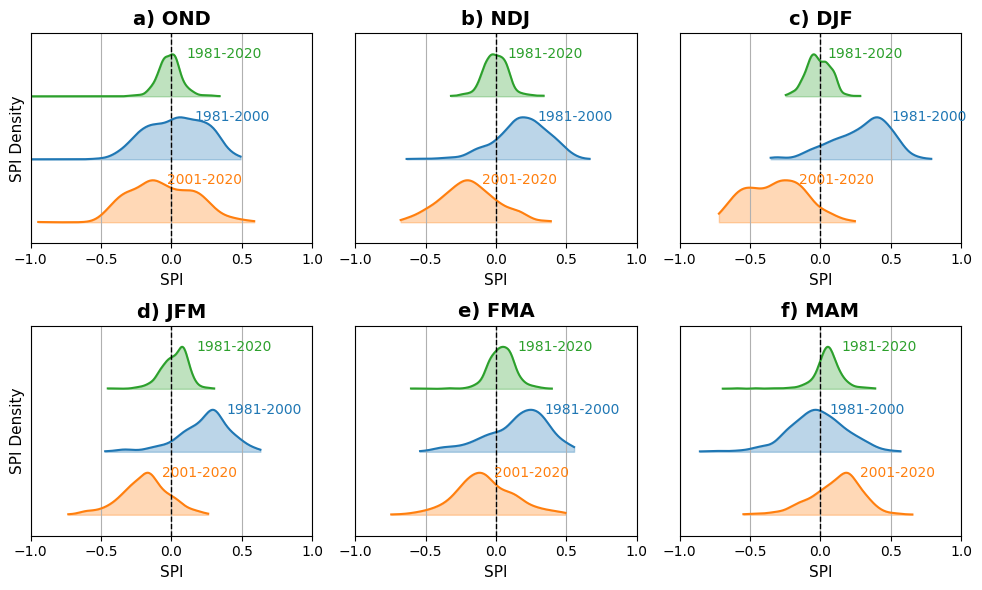

In [9]:
fig, axes = plt.subplots(2, 3, figsize=(10, 6))
axes = axes.flatten()

# New periods order and colors with reversed vertical order for plotting
periods_order = ['1981-2020', '1981-2000', '2001-2020']
colors = ['tab:green', 'tab:blue', 'tab:orange']
offsets = [3, 1.5, 0]

labels = ['a)', 'b)', 'c)', 'd)', 'e)', 'f)']

for i, season in enumerate(selected_seasons):
    ax = axes[i]
    max_density = 0
    
    for offset, period_name, color in zip(offsets, periods_order, colors):
        data = data_for_plot[season][period_name]
        
        if len(data) < 10:
            continue
        
        kde = gaussian_kde(data)
        xs = np.linspace(np.min(data), np.max(data), 200)
        ys = kde(xs)
        ys_scaled = ys / ys.max() + offset
        
        ax.plot(xs, ys_scaled, color=color)
        ax.fill_between(xs, offset, ys_scaled, color=color, alpha=0.3)
        
        # Add period label inside the plot next to the right end of the KDE
        x_text = xs[np.argmax(ys_scaled)] + 0.1
        y_text = ys_scaled[np.argmax(ys_scaled)]
        ax.text(x_text, y_text, period_name, color=color, fontsize=10, va='center')

        max_density = max(max_density, ys_scaled.max())

    ax.axvline(0, color='k', linestyle='--', linewidth=1)
    
    ax.set_yticks([])  # remove y-axis labels completely
    ax.set_ylim(-0.5, max_density + 0.5)
    ax.set_xlabel('SPI', fontsize=11)
    ax.set_title(f"{labels[i]} {season}", fontsize=14, fontweight='bold')
    ax.grid(True, axis='x')

    ax.set_xlim(-1, 1)
    
    if i % 3 == 0:
        ax.set_ylabel('SPI Density', fontsize=11)

# Turn off unused axes
for j in range(len(selected_seasons), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('figures/part1figs/fig2_kde.pdf', dpi=300)
plt.show()

# Suppl. Fig 1

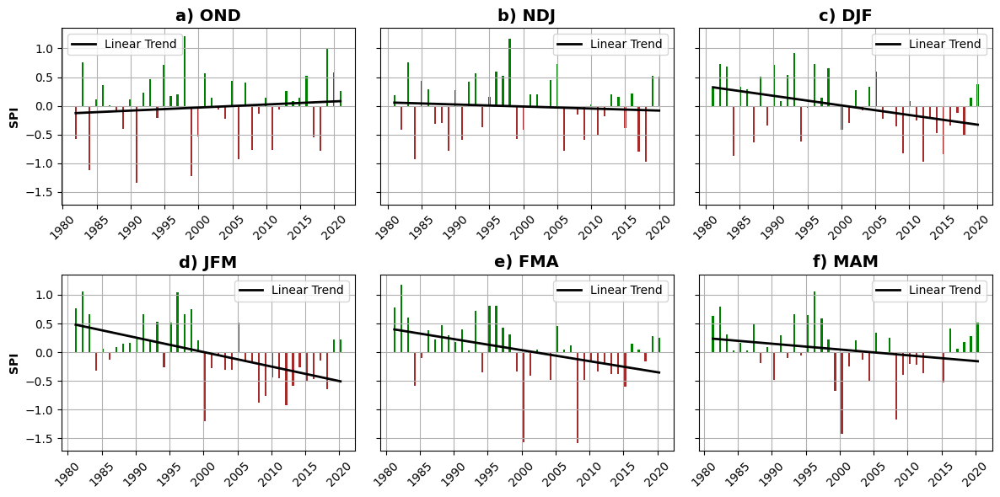

In [10]:
# Your selected seasons (replace with your actual 6 selected seasons)
selected_seasons = ['OND', 'NDJ','DJF', 'JFM', 'FMA', 'MAM']

fig, axes = plt.subplots(2, 3, figsize=(12, 6), sharey=True)
axes = axes.flatten()

labels = ['a)', 'b)', 'c)', 'd)', 'e)', 'f)']  # Label prefixes

for i, season in enumerate(selected_seasons):
    ax = axes[i]
    
    # month_to_season mapping
    month_to_season = {
        1: 'NDJ', 2: 'DJF', 3: 'JFM', 4: 'FMA',
        5: 'MAM', 6: 'AMJ', 7: 'MJJ', 8: 'JJA',
        9: 'JAS', 10: 'ASO', 11: 'SON', 12: 'OND'
    }
    
    # Get months for the current season
    months_in_season = [m for m, s in month_to_season.items() if s == season]
    
    # Filter spi data for these months
    spi_season = spi.sel(time=spi['time'].dt.month.isin(months_in_season))
    
    # Compute spatial average over domain for selected months & times
    spi_avg = spi_season.mean(dim=['lat', 'lon'])
    
    times = pd.to_datetime(spi_avg['time'].values)
    values = spi_avg.values
    
    # Linear regression
    time_numeric = np.arange(len(times))
    slope, intercept, r_value, p_value, std_err = linregress(time_numeric, values)
    trend_line = intercept + slope * time_numeric
    
    # Bar colors by sign
    colors = ['green' if v > 0 else 'brown' for v in values]
    
    # Plot bars and trend
    ax.bar(times, values, color=colors, width=100, align='center')
    ax.plot(times, trend_line, color='black', linewidth=2, label='Linear Trend')
    
    # Title with prefix label
    ax.set_title(f"{labels[i]} {season}", fontsize=14, fontweight='bold')
    
    if i % 3 == 0:
        ax.set_ylabel('SPI',fontweight='bold')
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45, labelsize=10)

# Hide unused axes if any
for j in range(len(selected_seasons), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('figures/part1figs/suppfig_ts_bar.pdf', dpi=300)
plt.show()

# Fig 3 Teleco SST

In [11]:

#NOAA COBE SST data
sst = xr.open_dataset('data/sst.mon.mean.nc').sortby('time').sel(time=slice('1900-01-01', '2024-12-31'))


sst['sst3m'] = sst['sst'] + sst['sst'].shift(time=1) + sst['sst'].shift(time=2)

#put lon is -180 to 180
#sst = sst.assign_coords(lon=(((sst.lon + 180) % 360) - 180)).sortby('lon')
#match time periods
sst = sst.sel(time=slice(spi['time'][0], spi['time'][-1]))
#lat=slice(60, -60), lon=slice(-180, 180))
#select enso region
sst = sst.sel(lat=slice(30, -30), lon=slice(140, 290))


In [26]:
def svd_analysis(left, right, n_modes=1, month=None, label=None, left_var="SST", right_var='SPI',land_mask=mask,
                 left_proj=ccrs.PlateCarree(central_longitude=150), right_proj = ccrs.PlateCarree(), detrend=False):


    if month is not None:
        months = ['NDJ', 'DJF', 'JFM', 'FMA', 'MAM', 'AMJ', 'MJJ', 'JJA', 'JAS', 'ASO', 'SON', 'OND']
        month_num = months.index(month) + 1
        left = left.sel(time=left['time.month'] == month_num)
        right = right.sel(time=right['time.month'] == month_num)
    right_mask = (right.isel(time=0).notnull().values) & (land_mask == 0)

    if right_var == 'SPI':
        right = right.where(right_mask)

    if detrend:
        def xr_detrend(da):
            return xr.apply_ufunc(
                scipy_detrend,
                da,
                input_core_dims=[['time']],
                output_core_dims=[['time']],
                vectorize=True,
                dask='parallelized',
                output_dtypes=[da.dtype]
            )
        left = xr_detrend(left.fillna(0)).transpose('time','lat','lon')
        right = xr_detrend(right.fillna(0)).transpose('time','lat','lon')

    left = (left - left.mean(dim='time', skipna=True)) / (left.std(dim='time', skipna=True) + 1e-6)
    right = (right - right.mean(dim='time', skipna=True)) / (right.std(dim='time', skipna=True) + 1e-6)

    mca = xMCA(left.fillna(0), right.fillna(0))
    mca.apply_coslat()
    mca.solve()


    X = left.fillna(0)
    Y = right.fillna(0)



    if month is not None:
        mca.set_field_names(f'{left_var} ({month})', f'{right_var} ({month})')
    else:
        mca.set_field_names({left_var}, {right_var})

    # --- ADDED: helper to compute Pearson r and p-value per gridcell
    from scipy.stats import pearsonr
    def correlate_grid_with_pval(grid_data, pc):
        """
        grid_data: DataArray (time, lat, lon)
        pc: DataArray (time,) aligned in time with grid_data
        Returns (corr_da, pval_da) as DataArray (lat, lon)
        """
        lats = grid_data['lat'].values
        lons = grid_data['lon'].values
        corr = np.full((len(lats), len(lons)), np.nan)
        pval = np.full((len(lats), len(lons)), np.nan)

        pc_vals = pc.values
        for i in range(len(lats)):
            for j in range(len(lons)):
                ts_da = grid_data.isel(lat=i, lon=j)
                ts = ts_da.values

                if ts.shape[0] != pc_vals.shape[0]:
                    try:
                        ts = ts_da.sel(time=pc['time']).values
                    except Exception:
                        continue

                mask = np.isfinite(ts) & np.isfinite(pc_vals)
                if np.sum(mask) < 3:
                    continue

                ts_masked = ts[mask]
                pc_masked = pc_vals[mask]

                # Skip if constant (all same value)
                if np.all(ts_masked == ts_masked[0]) or np.all(pc_masked == pc_masked[0]):
                    continue

                try:
                    r, p = pearsonr(pc_masked, ts_masked)
                except Exception:
                    r, p = np.nan, np.nan

                corr[i, j] = r
                pval[i, j] = p

        corr_da = xr.DataArray(corr, coords=[lats, lons], dims=['lat', 'lon'])
        pval_da = xr.DataArray(pval, coords=[lats, lons], dims=['lat', 'lon'])
        return corr_da, pval_da
    # --- END ADDED


    table = []
    for i in range(n_modes):
        fig = plt.figure(figsize=(18, 6))

                # Rank-1 reconstructions
        X_recon = mca.reconstructed_fields(mode=slice(i+1,i+2))['left']
        Y_recon = mca.reconstructed_fields(mode=slice(i+1,i+2))['right']

        # Total and explained variance
        total_var_X = np.sum(np.var(X, axis=0, ddof=1))
        total_var_Y = np.sum(np.var(Y, axis=0, ddof=1))
        explained_var_X = np.sum(np.var(X_recon, axis=0, ddof=1))
        explained_var_Y = np.sum(np.var(Y_recon, axis=0, ddof=1))

        frac_var_left = explained_var_X / total_var_X
        frac_var_right = explained_var_Y / total_var_Y


        left_map = mca.eofs()['left'].sel(mode=i+1)
        right_map = mca.eofs()['right'].sel(mode=i+1)
        right_map = right_map.where(right_mask)

        left_pcs = mca.pcs()['left'].sel(mode=i+1)
        right_pcs = mca.pcs()['right'].sel(mode=i+1)
        left_pcs = (left_pcs - left_pcs.mean()) / left_pcs.std()
        right_pcs = (right_pcs - right_pcs.mean()) / right_pcs.std()
        r_val = np.corrcoef(left_pcs.values, right_pcs.values)[0, 1]

                # Use PCs
        left_pcs = mca.pcs()['left'].sel(mode=i+1)
        right_pcs = mca.pcs()['right'].sel(mode=i+1)

        # Normalize PCs
        left_pcs = (left_pcs - left_pcs.mean()) / left_pcs.std()
        right_pcs = (right_pcs - right_pcs.mean()) / right_pcs.std()

        # Align time for correlation
        left = left.sel(time=left_pcs['time'])
        right = right.sel(time=right_pcs['time'])

        # Grid-wise correlation between PC and gridcell time series
        # --- REPLACED: compute correlation AND p-values with helper above
        left_map, left_pval = correlate_grid_with_pval(left, right_pcs)
        right_map, right_pval = correlate_grid_with_pval(right, left_pcs)
        # --- END REPLACEMENT

        # Mask invalid areas
        right_map = right_map.where(right_mask)
        left_map = left_map.where(~np.isnan(left.isel(time=0)))
        right_map = right_map.where(~np.isnan(right.isel(time=0)))

        explained_covar = mca.explained_variance()[i] / 100

        nino_lat_bounds = (5, -5)     # Latitude bounds
        nino_lon_bounds = (170, 240)  # Longitude bounds in 0-360



        # Subset and compute average anomaly over Nino3.4 region
        nino34_anom = left_map.sel(
        lon=slice(nino_lon_bounds[0], nino_lon_bounds[1]),
        lat=slice(nino_lat_bounds[0], nino_lat_bounds[1]))
        


        # Take the mean over time (or specific month if already selected)
        mean_nino34 = nino34_anom.mean()

        # Conditionally flip the sign based on Nino3.4 anomaly
        if mean_nino34 < 0 and left_var == 'SST':
            left_map = -left_map
            right_map = -right_map
            left_pcs = -left_pcs
            right_pcs = -right_pcs
        
        # NAO bounds western africa
        nao_lat_bounds = (20, 0)
        nao_lon_bounds = (-20, 20) 

        # Subset and compute average anomaly over NAO region
        nao_anom = left_map.sel(
        lon=slice(nao_lon_bounds[0], nao_lon_bounds[1]),
        lat=slice(nao_lat_bounds[0], nao_lat_bounds[1]))

        # Take the mean over time (or specific month if already selected)
        mean_nao = nao_anom.mean()

        # Conditionally flip the sign based on NAO anomaly
        if mean_nao <0 and left_var == 'SLP':
             left_map = -left_map
             right_map = -right_map
             left_pcs = -left_pcs
             right_pcs = -right_pcs

        #print table with explaine covariance and explaine variance and pc time series correlation

        #print(f"Mode {i+1}:")
        #print(f"Explained Variance {left_var}: {frac_var_left:.2%}")
        #print(f"Explained Variance {right_var}: {frac_var_right:.2%}")
        #print(f"Pearson r between PCs: {r_val:.2f}\n")
        #print(f"Explained Covariance: {explained_covar:.1%}\n")

        #save these values in a table

        table.append([i+1, np.round(100*frac_var_left.values,1), np.round(100*frac_var_right.values,1),
                       np.round(r_val,2), np.round(explained_covar.values*100,1)])

        cbar_ticks = [-0.6,-0.5,-0.4, -0.3,-0.2,-0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]

        cmap_discrete = plt.get_cmap('RdBu_r', len(cbar_ticks)-1)

        #apply nan mask to left_map and right_map
        left_map = left_map.where(~np.isnan(left.isel(time=0)).values)
        right_map = right_map.where(right_mask)



        ax1 = fig.add_subplot(1, 3, 1, projection=left_proj)
        pcm1 = ax1.pcolormesh(
            left_map['lon'], left_map['lat'], left_map,
            transform=ccrs.PlateCarree(), cmap=cmap_discrete, 
            vmin=-0.6, vmax=0.6
        )
        ax1.coastlines()
        cbar1 = plt.colorbar(pcm1, ax=ax1, orientation='horizontal', pad=0.03, shrink=0.8,
                            format=mticker.FormatStrFormatter('%.1f'))
        cbar1.set_label(f"{left_var} Corr. - Expl. Var. {frac_var_left:.1%}", fontsize=14, fontweight='bold')
        cbar1.ax.tick_params(labelsize=12)
        cbar1.ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))
        ax1.tick_params(labelsize=12)

        # --- ADDED: hatch non-significant regions on left map (p > 0.05)
        alpha = 0.05
        try:
            sig_mask_left = (left_pval > alpha).astype(int)
            cs1 = ax1.contourf(
                left_map['lon'], left_map['lat'], sig_mask_left,
                levels=[0.5, 1.5], hatches=['///', None], colors='none',
                transform=ccrs.PlateCarree()
            )

            # Loop through contourf's collections to customize hatching
            for coll in cs1.collections:
                coll.set_edgecolor("black")   # hatch color
                coll.set_linewidth(0.8)     # hatch thickness
        except Exception:
            pass


        ax2 = fig.add_subplot(1, 3, 2)

        ax2.plot(left_pcs['time'], left_pcs, label=left_var, color='darkred', linewidth=2)
        ax2.plot(right_pcs['time'], right_pcs, label=right_var, color='darkblue', linewidth=2)
        ax2.set_title("Time Series", fontsize=14, fontweight='bold')
        ax2.legend(fontsize=14, loc='upper left')
        ax2.tick_params(labelsize=12)
        ax2.grid(True)
        ax2.set_ylim(-3, 3)

        ax2.text(0.95, 0.05, f"Pearson r = {r_val:.2f}",
                transform=ax2.transAxes,
                horizontalalignment='right',
                verticalalignment='bottom',
                fontsize=14,
                fontweight='bold',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray', boxstyle='round'))

        
        cmap_discrete_right = plt.get_cmap('BrBG', len(cbar_ticks)-1)


        ax3 = fig.add_subplot(1, 3, 3, projection=right_proj)
        pcm2 = ax3.pcolormesh(
            right_map['lon'], right_map['lat'], right_map,
            transform=ccrs.PlateCarree(), cmap=cmap_discrete_right,
            vmin=-0.6, vmax=0.6
        )
        ax3.coastlines()
        ax3.add_feature(cfeature.BORDERS, linewidth=0.6)
        ax3.add_feature(cfeature.LAND, facecolor="gray", alpha=0.45)

        cbar2 = plt.colorbar(pcm2, ax=ax3, orientation='horizontal', pad=0.03, shrink=0.8,
                            format=mticker.FormatStrFormatter('%.1f'))
        cbar2.set_label(f"{right_var} Corr. - Expl. Var. {frac_var_right:.1%}", fontsize=14, fontweight='bold')
        cbar2.ax.tick_params(labelsize=12)
        cbar2.ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))
        ax3.tick_params(labelsize=12)

        # --- ADDED: hatch non-significant regions on right map (p > 0.05)
        try:
            sig_mask_right = (right_pval > alpha).astype(int)
            cs3 = ax3.contourf(
                right_map['lon'], right_map['lat'], sig_mask_right,
                levels=[0.5, 1.5], hatches=['///', None], colors='none',
                transform=ccrs.PlateCarree()
            )

            # Loop through contourf's collections to customize hatching
            for coll in cs3.collections:
                #coll.set_edgecolor("black")   # hatch color
                coll.set_linewidth(1.5)     # hatch thickness
        except Exception:
            pass
        # --- END ADDED

        
        title = f"{label} {month} – Explained Covar.: {explained_covar:.1%}"
        plt.suptitle(title, fontsize=18, fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.95])

        if detrend:
            plt.savefig(f'figures/telecos/svd_detrended_{left_var}_{right_var}_{month}_mode{i+1}.pdf', dpi=150)
        else:
            plt.savefig(f'figures/telecos/svd_{left_var}_{right_var}_{month}_mode{i+1}.pdf', dpi=150)

        #merge pcs in one dataframe
        pcs_df = pd.concat([left_pcs.to_dataframe(), right_pcs.to_dataframe()], axis=1)

        #save pc time series to csv
        if detrend:

            pcs_df.to_csv(f'figures/telecos/svd_detrended_{left_var}_{right_var}_{month}_mode{i+1}_PC.csv', index=True)
        else:
            pcs_df.to_csv(f'figures/telecos/svd_{left_var}_{right_var}_{month}_mode{i+1}_PC.csv', index=True)



        # Show only for mode 1
        if i == 0:
            plt.show()

        # Always close to free memory
        plt.close()
                
                
    df = pd.DataFrame(
            table,
            columns=["Mode", f"Explained Var {left_var}", f"Explained Var {right_var}", "Pearson r", "Explained Cov"]
            )
            #save table as csv
    if detrend:
        df.to_csv(f'figures/telecos/svd_detrended_{left_var}_{right_var}_{month}_table.csv', index=False)
    else:
        df.to_csv(f'figures/telecos/svd_{left_var}_{right_var}_{month}_table.csv', index=False)


Processing season: OND 


c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


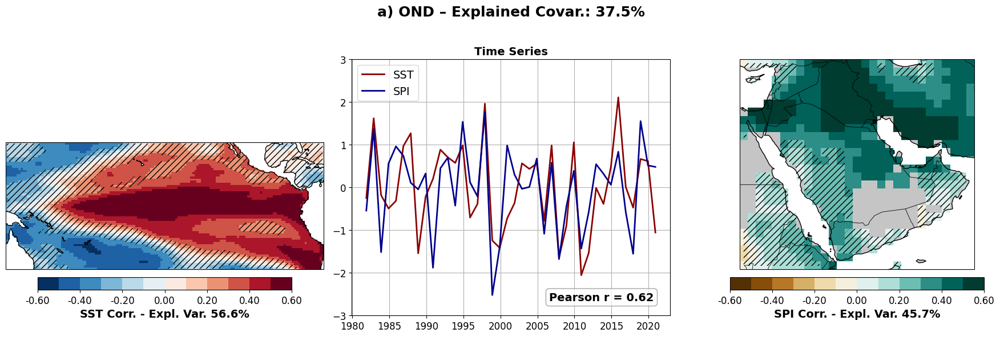

Processing season: OND with detrending


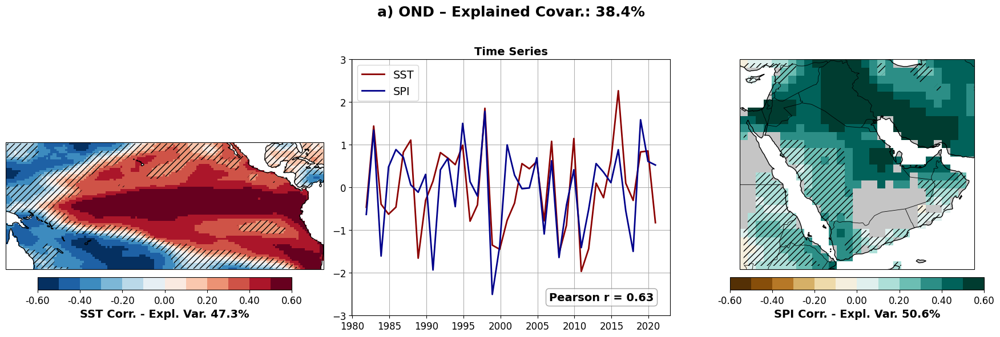

Processing season: NDJ 


c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


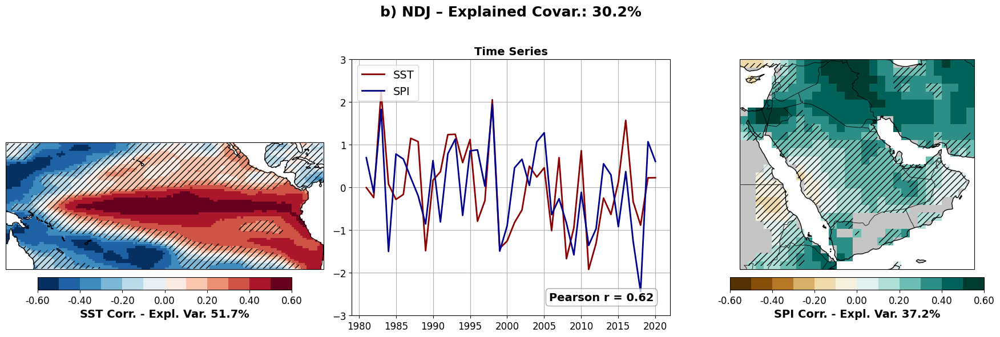

Processing season: NDJ with detrending


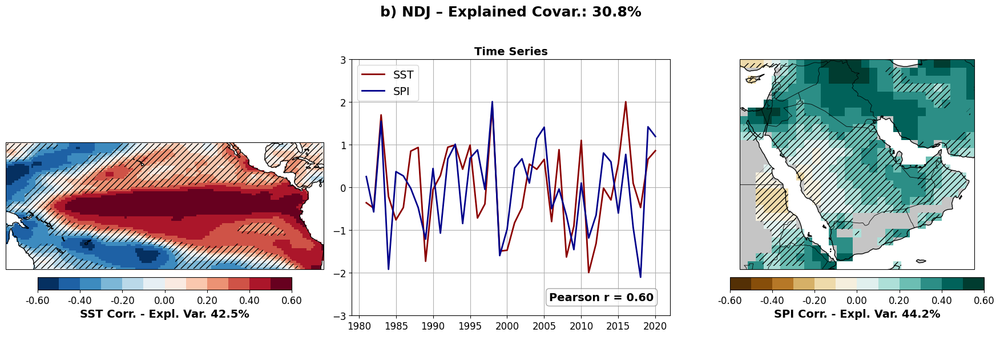

Processing season: DJF 


c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


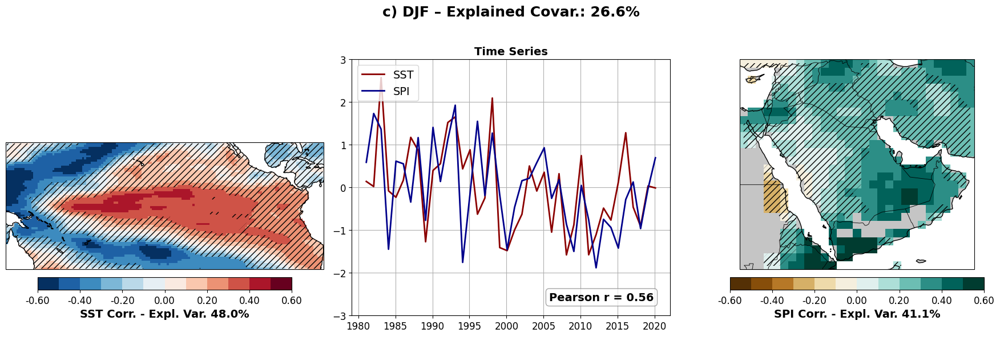

Processing season: DJF with detrending


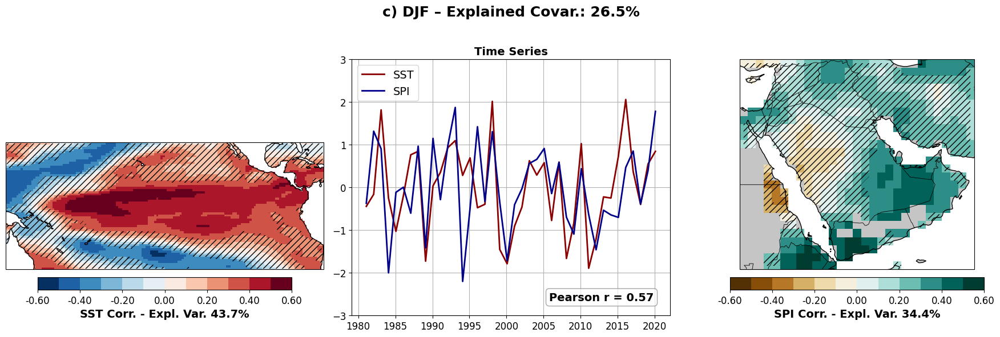

Processing season: JFM 


c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


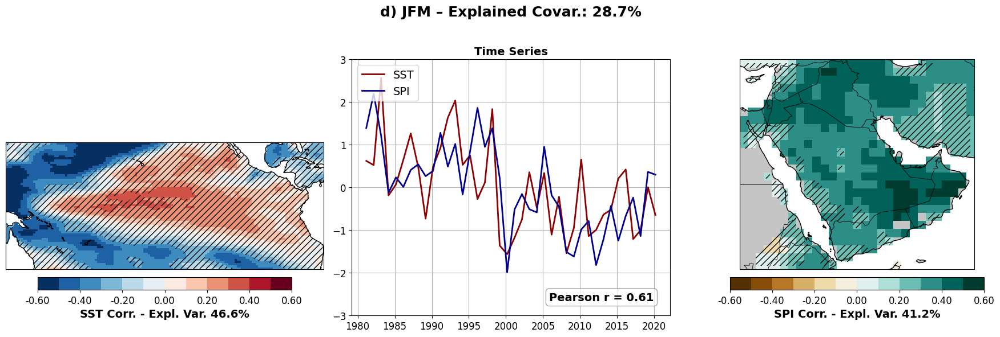

Processing season: JFM with detrending


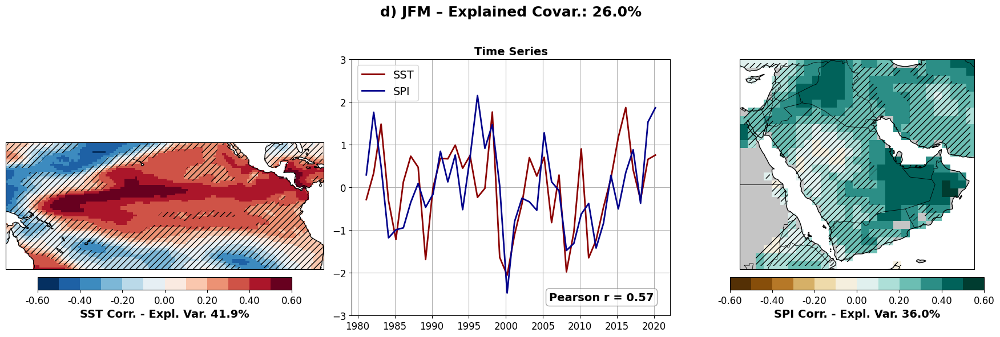

Processing season: FMA 


c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


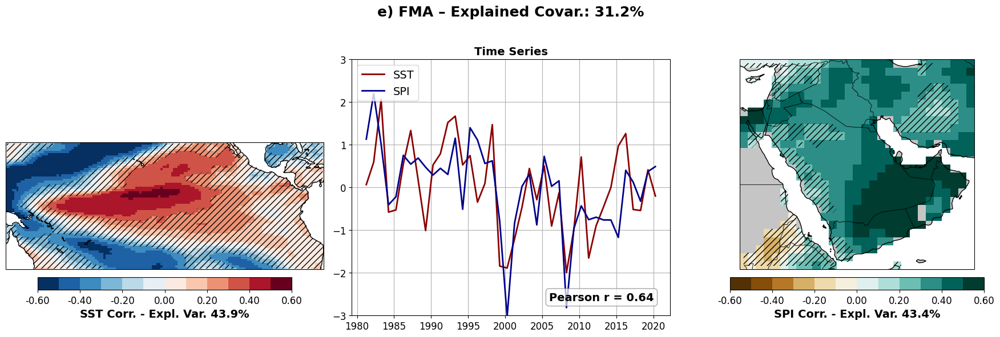

Processing season: FMA with detrending


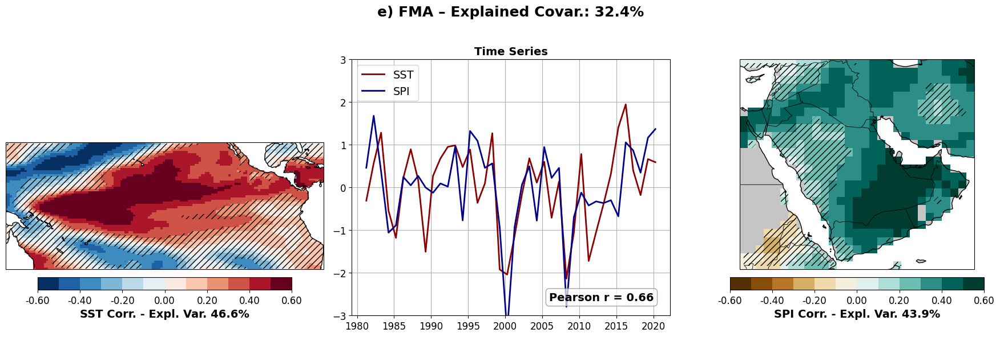

Processing season: MAM 


c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


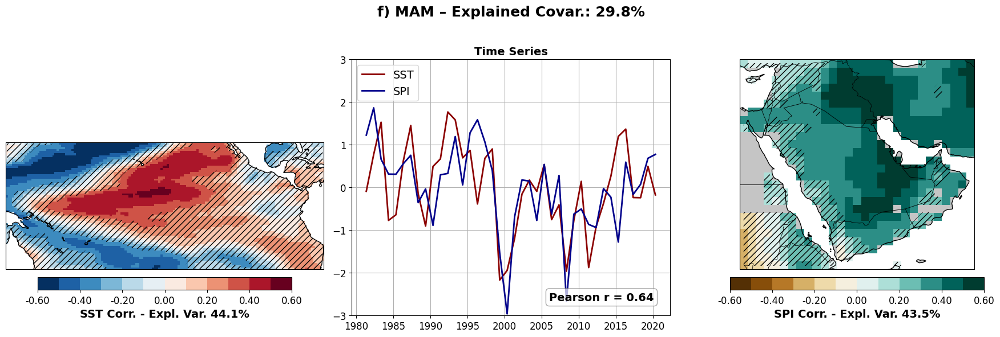

Processing season: MAM with detrending


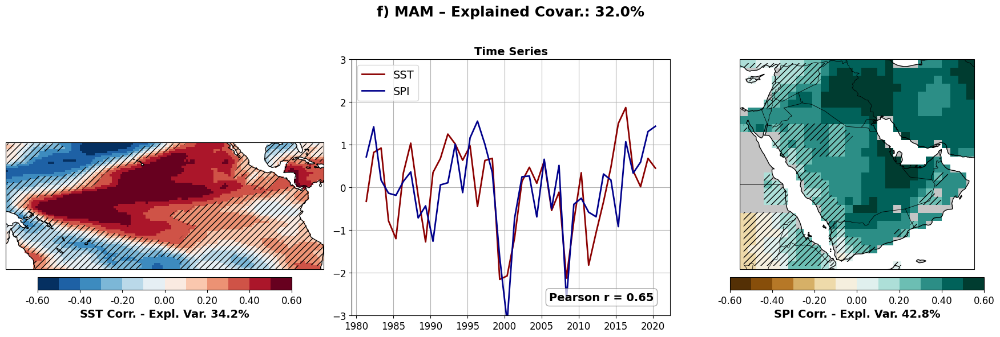

In [27]:
seasons = ['OND', 'NDJ', 'DJF', 'JFM', 'FMA', 'MAM']
labels = ['a)', 'b)', 'c)', 'd)', 'e)', 'f)']


for season, label in zip(seasons, labels):
    print(f"Processing season: {season} ")
    svd_analysis(sst.sst3m, spi, left_var='SST',n_modes=3, month=season, label=label)
    print(f"Processing season: {season} with detrending")
    svd_analysis(sst.sst3m,spi, left_var='SST', n_modes=3, month=season, label=label,detrend=True)

# Fig 4 Teleco SLP

In [28]:

#NOAA COBE SST data
slp = xr.open_dataset('data/mslp.mon.mean.nc').sortby('time')


slp['slp3m'] = slp['mslp'] + slp['mslp'].shift(time=1) + slp['mslp'].shift(time=2)

#put lon is -180 to 180
slp = slp.assign_coords(lon=(((slp.lon + 180) % 360) - 180)).sortby('lon')
#match time periods
slp = slp.sel(time=slice(spi['time'][0], spi['time'][-1]))

slp = slp.sel(lat=slice(80, 20), lon=slice(-90, 40))

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


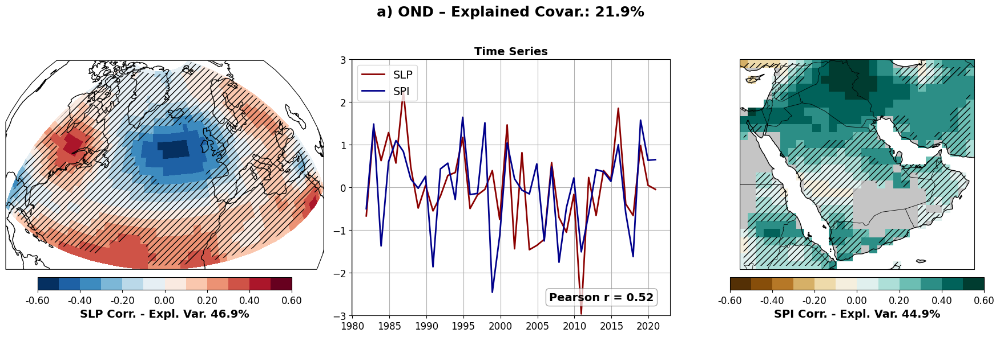

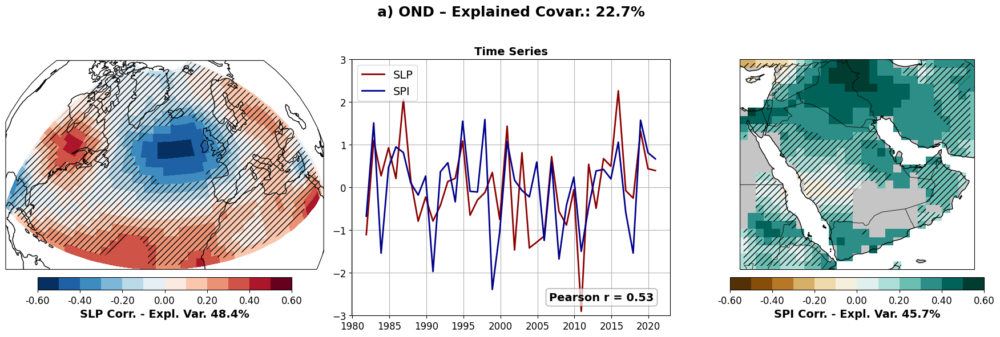

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


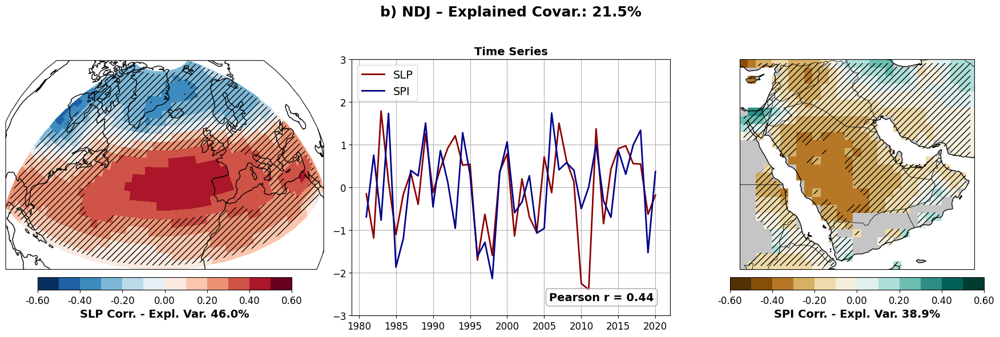

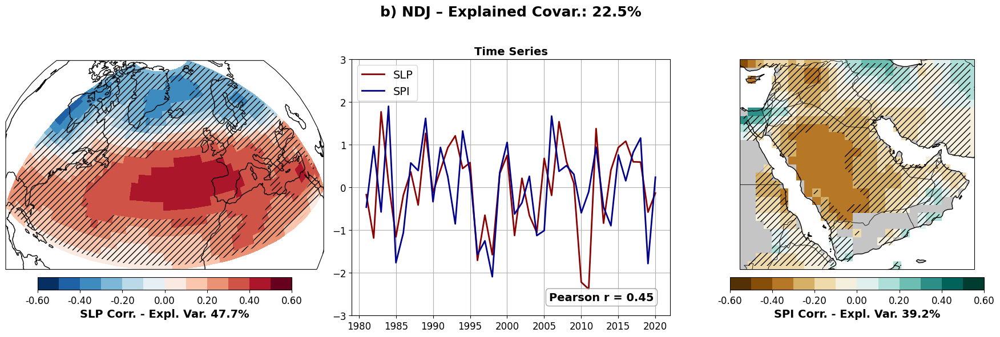

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


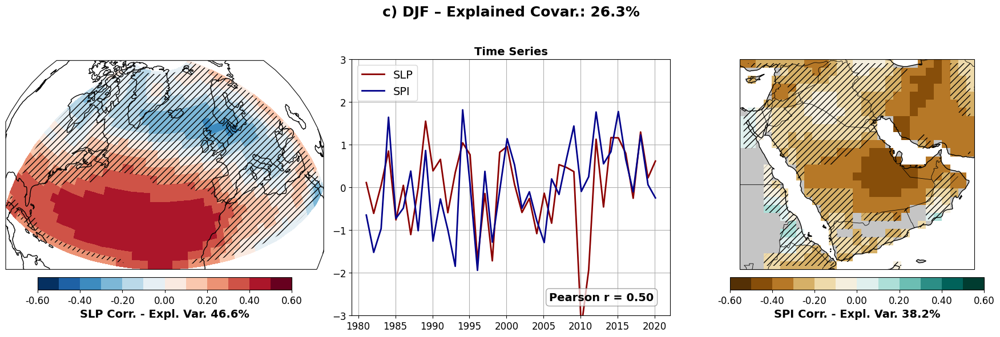

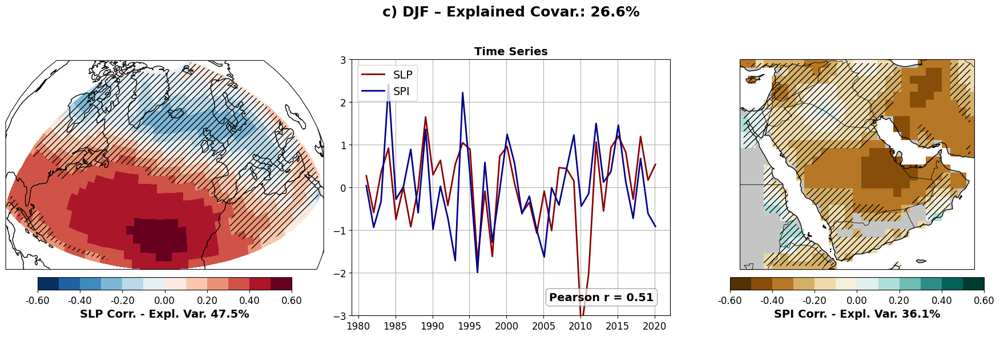

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


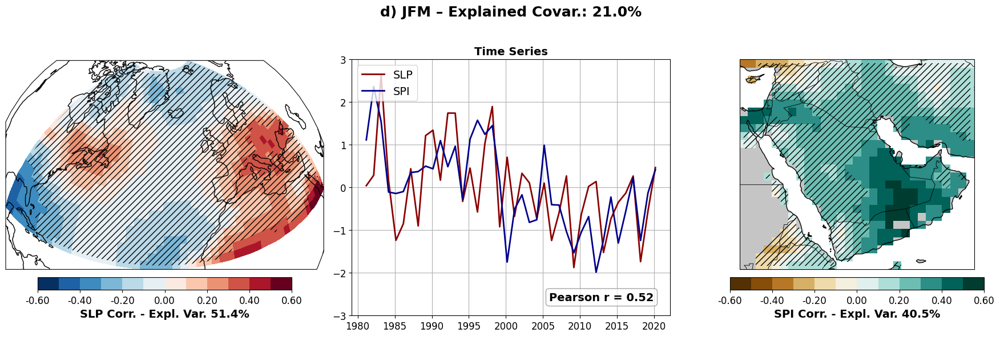

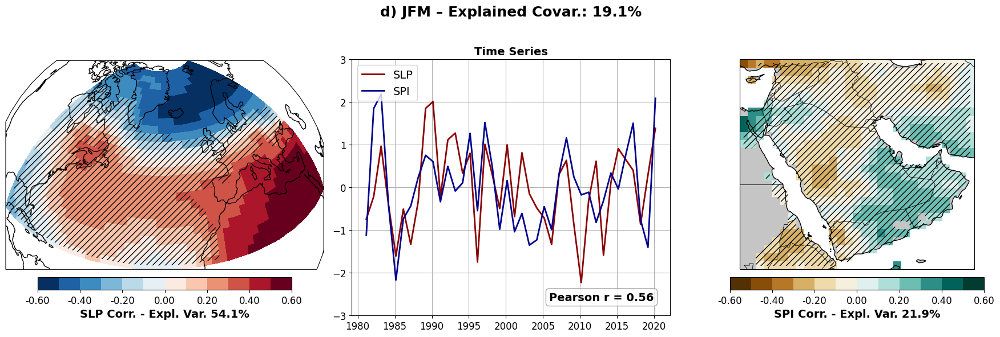

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


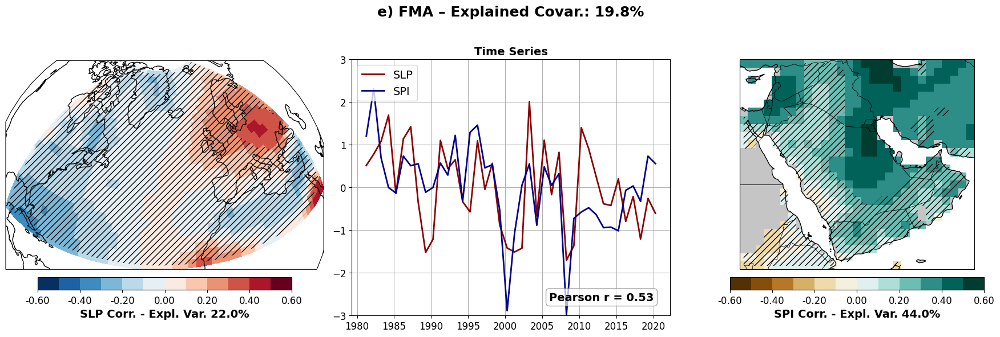

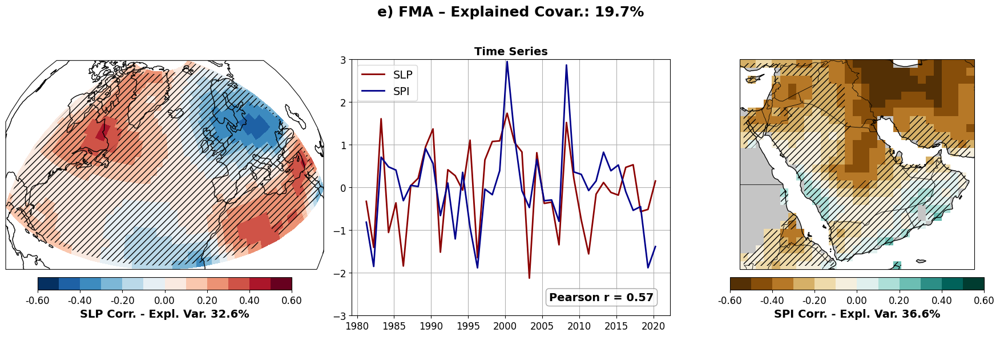

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


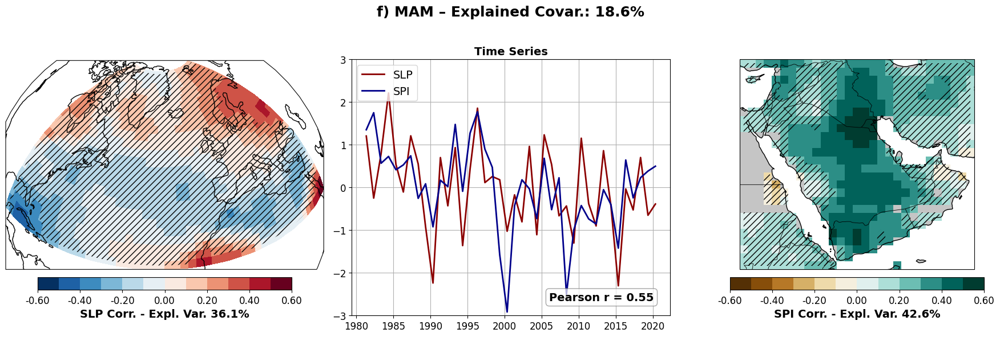

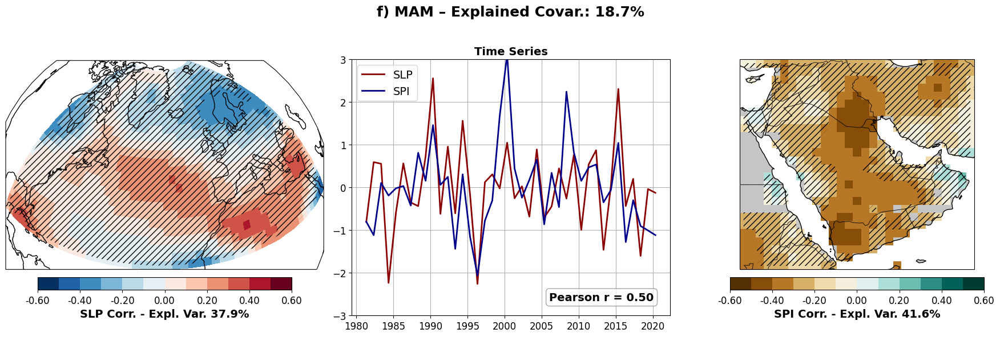

In [29]:
seasons = ['OND', 'NDJ', 'DJF', 'JFM', 'FMA', 'MAM']
labels = ['a)', 'b)', 'c)', 'd)', 'e)', 'f)']
for season, label in zip(seasons, labels):
    svd_analysis(slp.slp3m,spi,  n_modes=3,
                 month=season, label=label, left_var='SLP',
                 left_proj=ccrs.NearsidePerspective(central_longitude=-30, central_latitude=40))
    svd_analysis(slp.slp3m, spi, n_modes=3,
                 month=season, label=label, left_var='SLP',
                  left_proj=ccrs.NearsidePerspective(central_longitude=-30, central_latitude=40), detrend=True)

# GPH regressions

In [40]:
#NOAA COBE SST data
gph = xr.open_dataset('data/hgt.mon.mean.nc').sortby('time').sel(time=slice('1900-01-01', '2024-12-31'),
                                                                  level=500, lat=slice(70, 5), lon=slice(0, 100))

gph['hgt3m'] = gph['hgt'] + gph['hgt'].shift(time=1) + gph['hgt'].shift(time=2)

#put lon is -180 to 180
#gph = gph.assign_coords(lon=(((gph.lon + 180) % 360) - 180)).sortby('lon')
#match time periods
gph = gph.sel(time=slice(spi['time'][0], spi['time'][-1]))
#lat=slice(60, -60), lon=slice(-180, 180))

if not os.path.exists('figures/gph'):
    os.makedirs('figures/gph')

In [47]:
def svd_regression_gph(
    sst, spi, hpa, n_modes=1, detrend=False, month=None, 
    proj=ccrs.PlateCarree(), label=None, method='corr',
    norm_preds = True
):
    if month is not None:
        months = ['NDJ', 'DJF', 'JFM', 'FMA', 'MAM', 'AMJ', 'MJJ', 'JJA', 'JAS', 'ASO', 'SON', 'OND']
        month_num = months.index(month) + 1
        sst = sst.sel(time=sst['time.month'] == month_num)
        hpa = hpa.sel(time=hpa['time.month'] == month_num)
        spi = spi.sel(time=spi['time.month'] == month_num)

    def xr_detrend(da):
        return xr.apply_ufunc(
            scipy_detrend, da,
            input_core_dims=[['time']],
            output_core_dims=[['time']],
            vectorize=True, dask='parallelized', output_dtypes=[da.dtype]
        )

    def get_all_pcs(X, Y):
        if detrend:
            X = xr_detrend(X.fillna(0)).transpose('time', 'lat', 'lon')
            Y = xr_detrend(Y.fillna(0)).transpose('time', 'lat', 'lon')
        X = (X - X.mean('time')) / (X.std('time') + 1e-6)
        Y = (Y - Y.mean('time')) / (Y.std('time') + 1e-6)
        mca = xMCA(X.fillna(0), Y.fillna(0))
        mca.apply_coslat()
        mca.solve()
        return mca.pcs()['left'], mca.pcs()['right']

    period = slice('1991-01-01', '2020-12-31')
    sst = sst.sel(time=period).transpose('time', 'lat', 'lon')
    spi = spi.sel(time=period).transpose('time', 'lat', 'lon')
    hpa = hpa.sel(time=period).transpose('time', 'lat', 'lon')

    pcs_sst, pcs_spi = get_all_pcs(sst, spi)
    #normalize the pcs
    if norm_preds:
        pcs_sst = (pcs_sst - pcs_sst.mean('time')) / (pcs_sst.std('time') + 1e-6)
        pcs_spi = (pcs_spi - pcs_spi.mean('time')) / (pcs_spi.std('time') + 1e-6)

    def grid_analysis(grid_data, pc, method='corr'):
        lats = grid_data['lat'].values
        lons = grid_data['lon'].values
        result = np.full((len(lats), len(lons)), np.nan)
        pval_grid = np.full((len(lats), len(lons)), np.nan)
        pc_vals = pc.values

        for i in range(len(lats)):
            for j in range(len(lons)):
                ts_da = grid_data.isel(lat=i, lon=j)
                ts = ts_da.values
                if ts.shape[0] != pc_vals.shape[0]:
                    try:
                        ts = ts_da.sel(time=pc['time']).values
                    except Exception:
                        continue
                mask = np.isfinite(ts) & np.isfinite(pc_vals)
                if np.sum(mask) < 3:
                    continue
                ts_masked = ts[mask]
                pc_masked = pc_vals[mask]

                if method == 'corr':
                    if np.all(ts_masked == ts_masked[0]) or np.all(pc_masked == pc_masked[0]):
                        continue
                    try:
                        r, p = pearsonr(pc_masked, ts_masked)
                    except Exception:
                        r, p = np.nan, np.nan
                    result[i, j] = r
                    pval_grid[i, j] = p

                elif method == 'reg':
                    try:
                        X_sm = sm.add_constant(pc_masked)
                        model = sm.OLS(ts_masked, X_sm).fit()
                        result[i, j] = model.params[1]
                        pval_grid[i, j] = model.pvalues[1]
                    except Exception:
                        result[i, j] = np.nan
                        pval_grid[i, j] = np.nan

        return xr.DataArray(result, coords=[lats, lons], dims=['lat', 'lon']), \
               xr.DataArray(pval_grid, coords=[lats, lons], dims=['lat', 'lon'])

    for mode_idx in range(1, n_modes + 1):
        pc_sst = pcs_sst.sel(mode=mode_idx)
        pc_spi = pcs_spi.sel(mode=mode_idx)

        res_sst, pval_sst = grid_analysis(hpa, pc_sst, method=method)
        res_spi, pval_spi = grid_analysis(hpa, pc_spi, method=method)

        fig, axes = plt.subplots(1, 2, figsize=(12, 4), subplot_kw={'projection': proj})
        cmap = cm.get_cmap('RdBu_r')

        if method == 'corr':
            levels = np.arange(-0.6, 0.61, 0.1)
        else:
            # Regression: separate scales for left and right
            levels_left = np.arange(-40, 41, 5)
            levels_right = np.arange(-40, 41, 5)  # you can adjust scales here

        for idx, (ax, res_da, pval_da, title) in enumerate(zip(
            axes, [res_sst, res_spi], [pval_sst, pval_spi],
            [f"SST Mode {mode_idx}", f"SPI Mode {mode_idx}"]
        )):
            # --- significance mask shading ---
            sig_05 = pval_da < 0.05
            sig_10 = (pval_da < 0.1) & ~sig_05

            ax.contourf(
                res_da['lon'], res_da['lat'], sig_10,
                levels=[0.5, 1.5], colors='lightgray',
                transform=ccrs.PlateCarree(), alpha=0.6
            )
            ax.contourf(
                res_da['lon'], res_da['lat'], sig_05,
                levels=[0.5, 1.5], colors='dimgray',
                transform=ccrs.PlateCarree(), alpha=0.6
            )

            # --- contour lines ---
            clevels = np.arange(-40, 45, 5) if method == 'reg' else np.arange(-0.6, 0.65, 0.05)
            # --- contour lines ---
            clevels = np.arange(-40, 45, 5) if method == 'reg' else np.arange(-0.6, 0.65, 0.05)
            cs = ax.contour(
                res_da['lon'], res_da['lat'], res_da,
                levels=clevels, colors='black',
                linewidths=0.7, transform=ccrs.PlateCarree()
            )

            # label contours with their coefficient values
            if method == 'reg':
                ax.clabel(cs, inline=True, fontsize=7, fmt="%.1f")   # regression betas
            else:
                ax.clabel(cs, inline=True, fontsize=7, fmt="%.2f")   # correlations


            ax.set_title(title)
            ax.coastlines()

            # Colorbars
            #cbar = fig.colorbar(cf, ax=ax, orientation='horizontal', pad=0.05, aspect=50, shrink=0.8)
            #cbar.set_label('Pearson Correlation' if method=='corr' else 'OLS Beta',
            #               fontweight='bold', fontsize=12)

        fig.suptitle(f"{label} {month}", fontsize=14, fontweight='bold')
        plt.savefig(f'figures/gph/{method}_hpa_{month}_mode{mode_idx}.pdf', dpi=150)
        plt.show()
        plt.close()

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


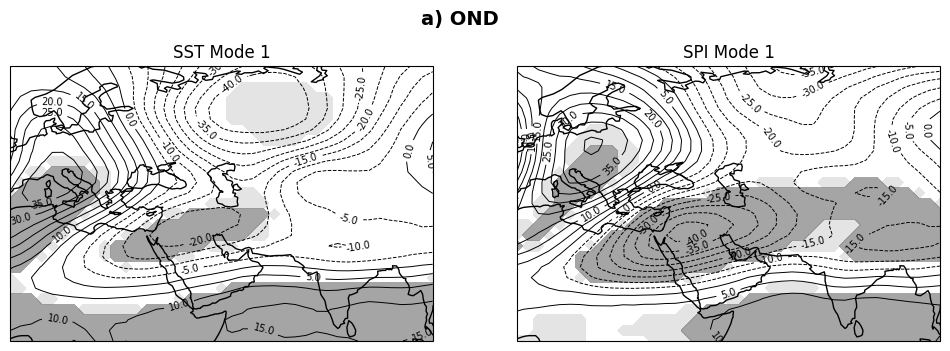

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


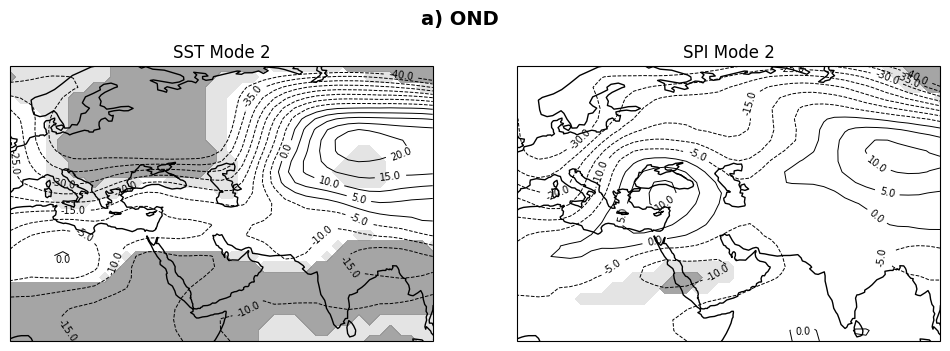

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


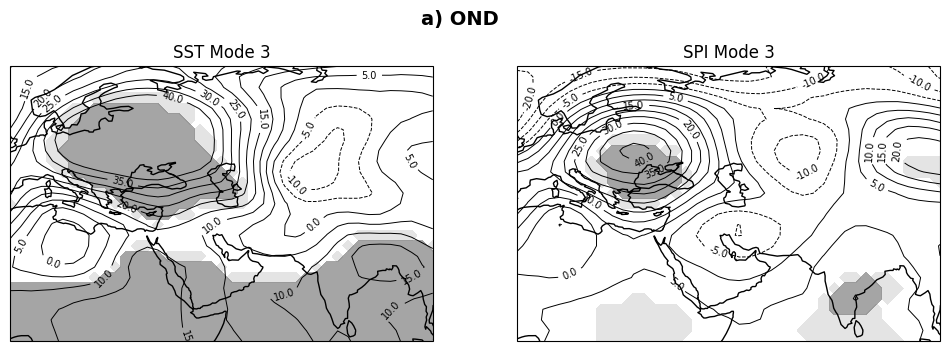

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


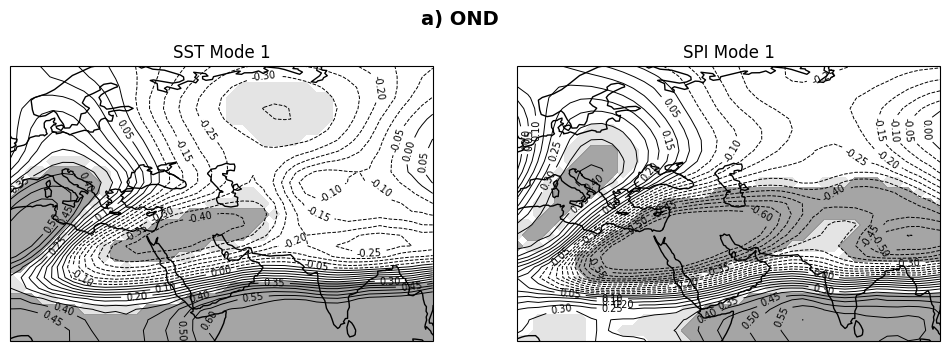

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


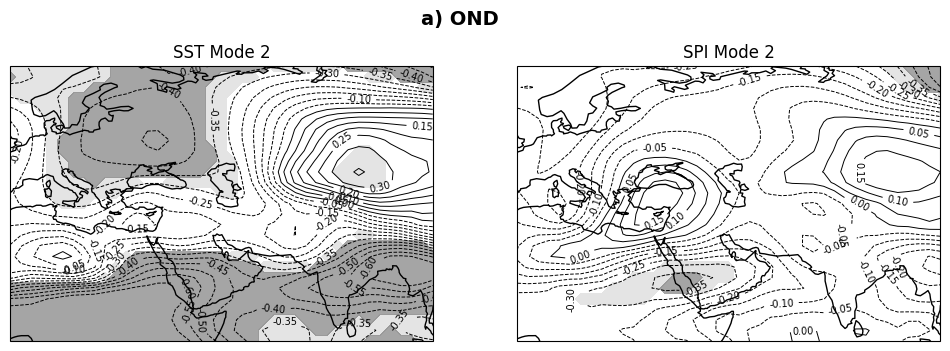

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


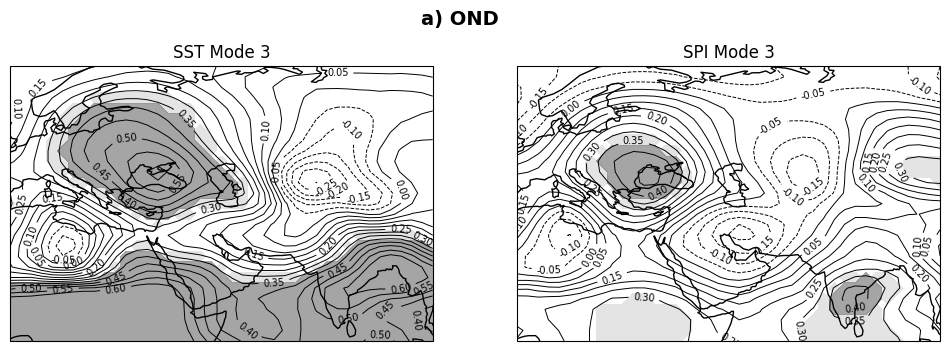

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


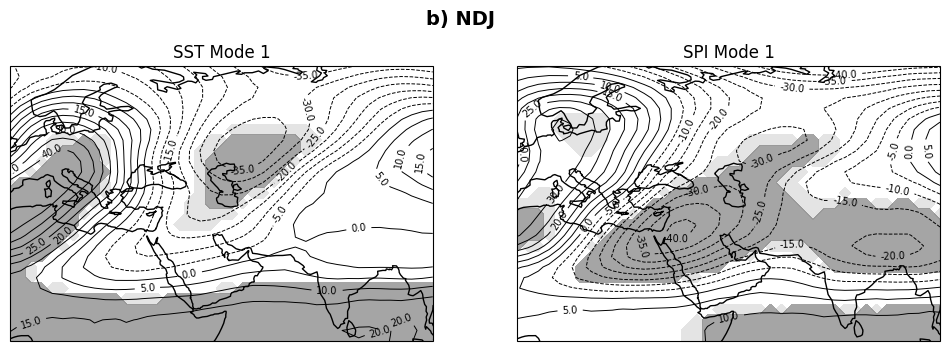

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


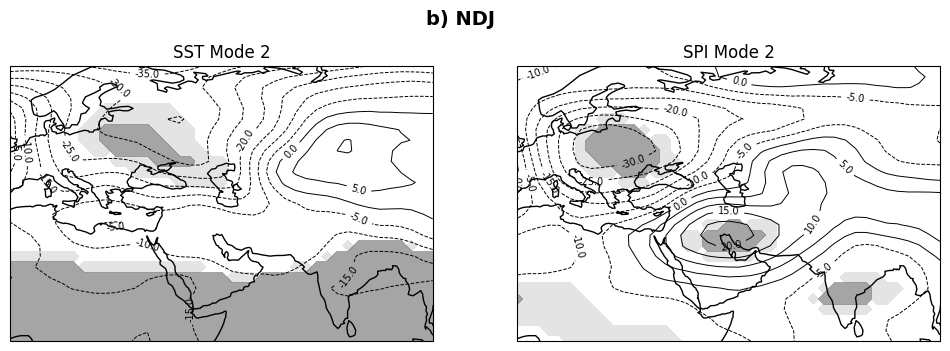

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


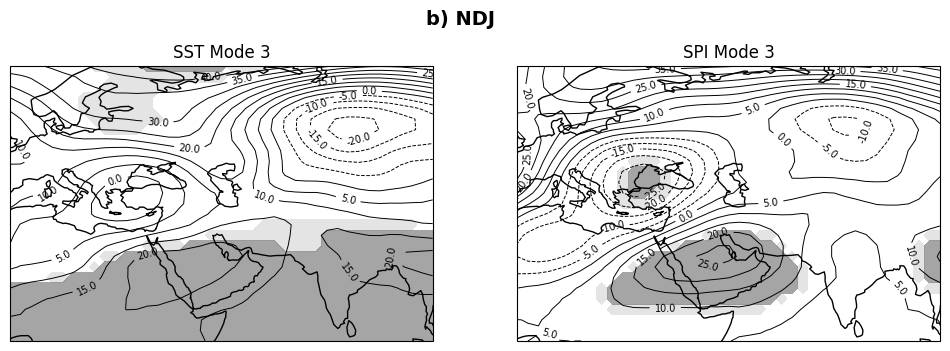

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


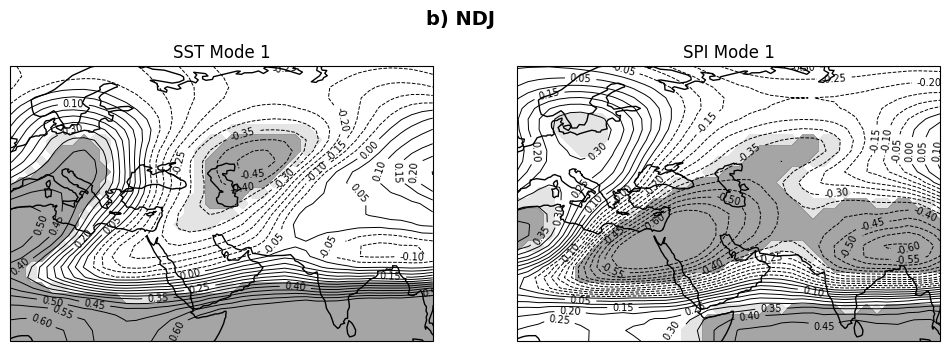

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


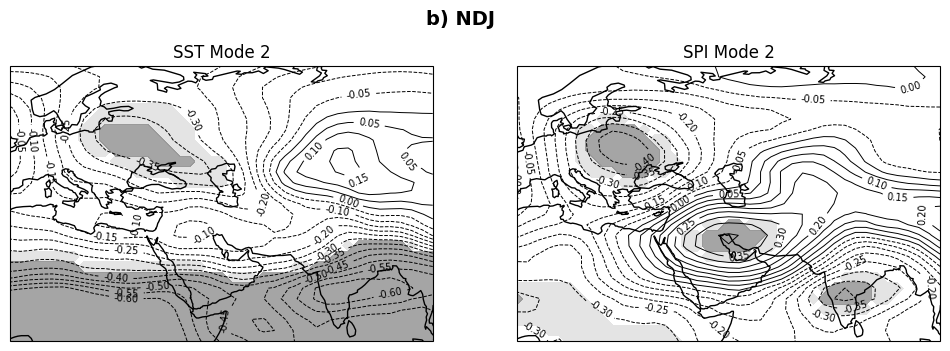

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


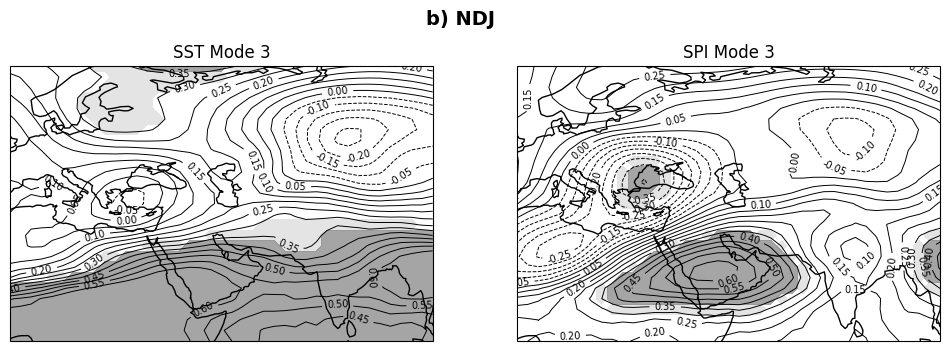

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


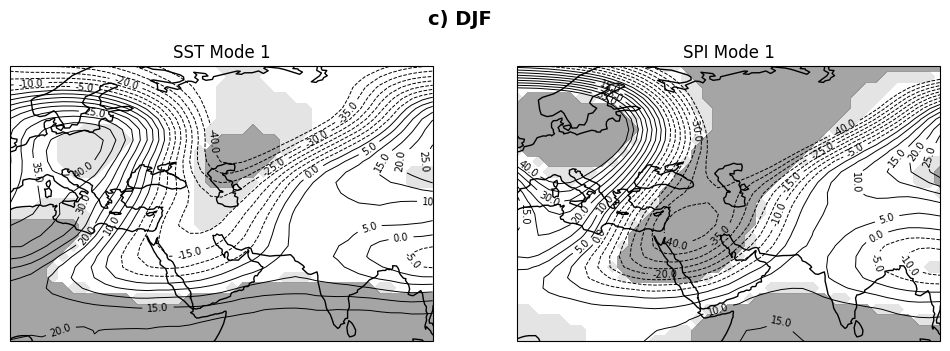

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


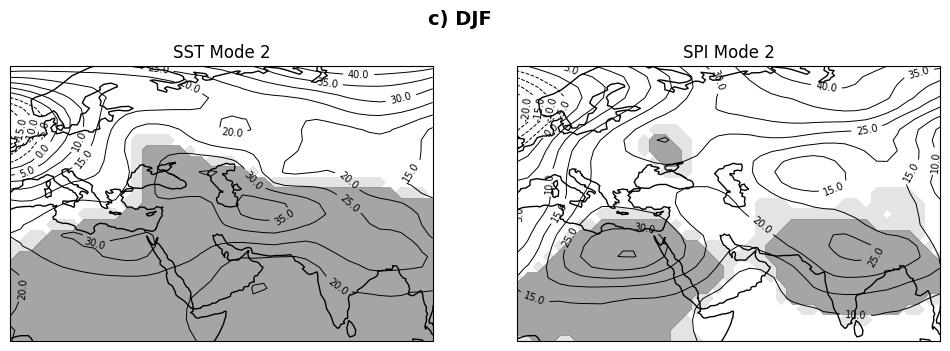

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


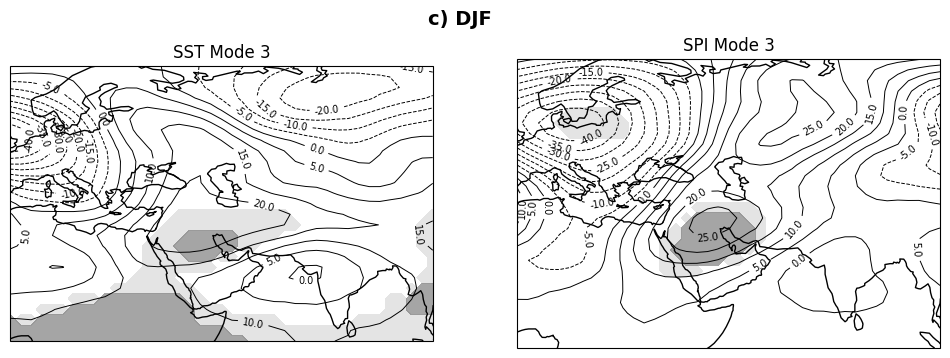

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


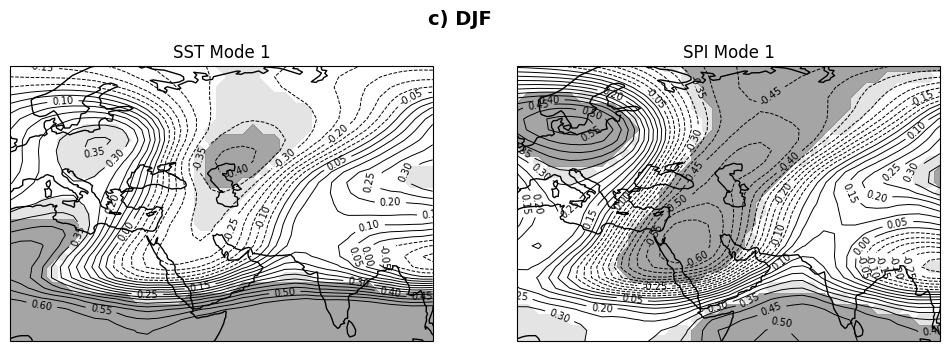

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


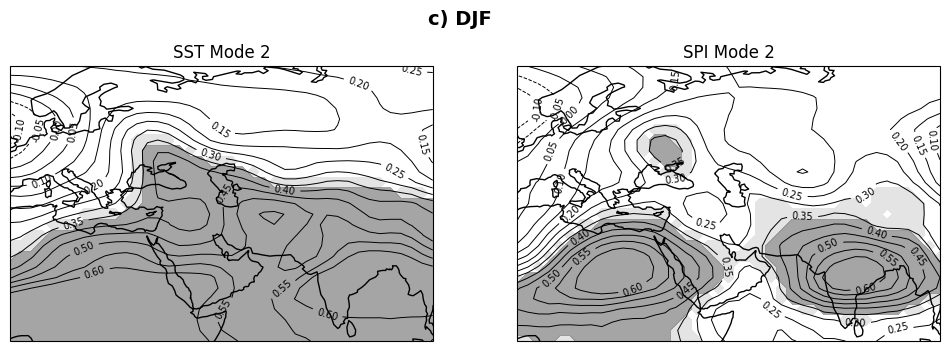

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


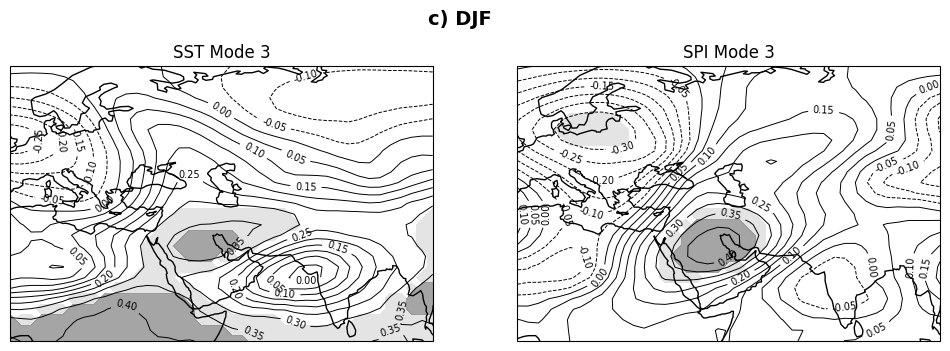

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


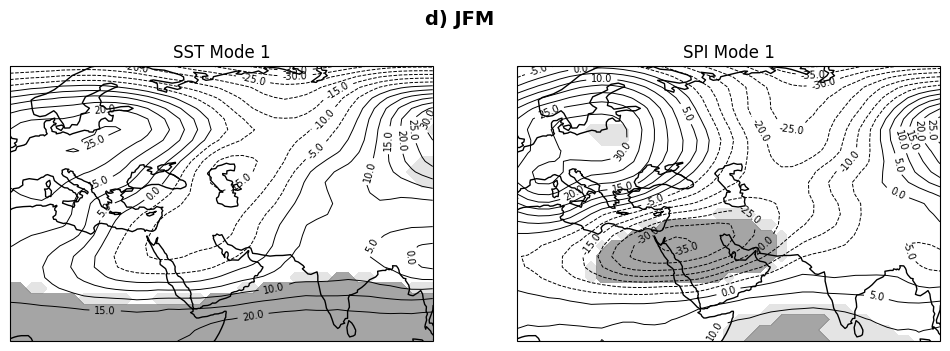

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


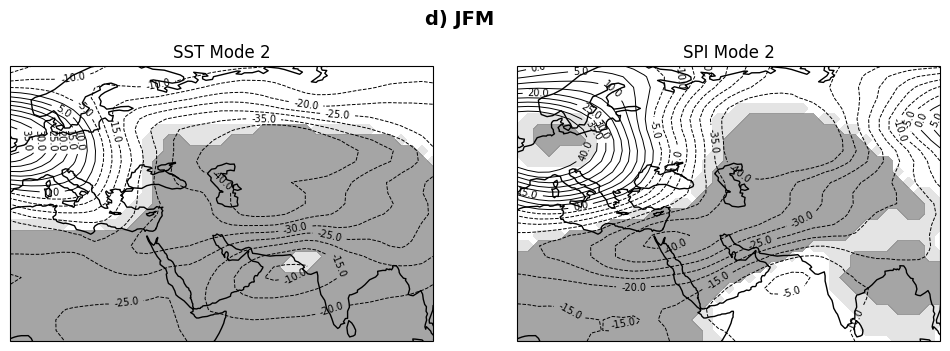

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


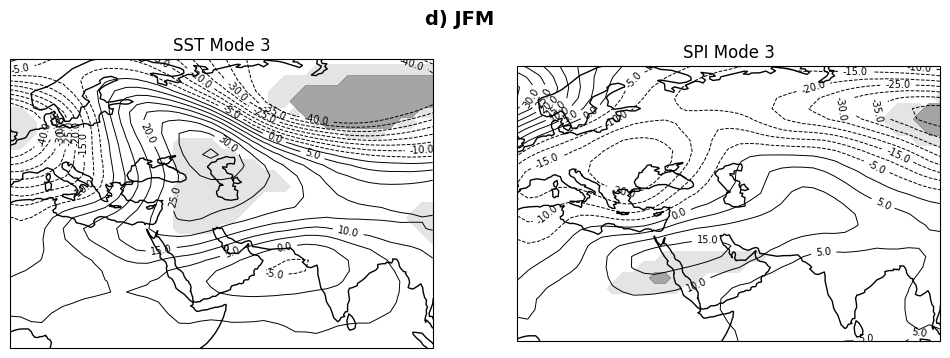

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


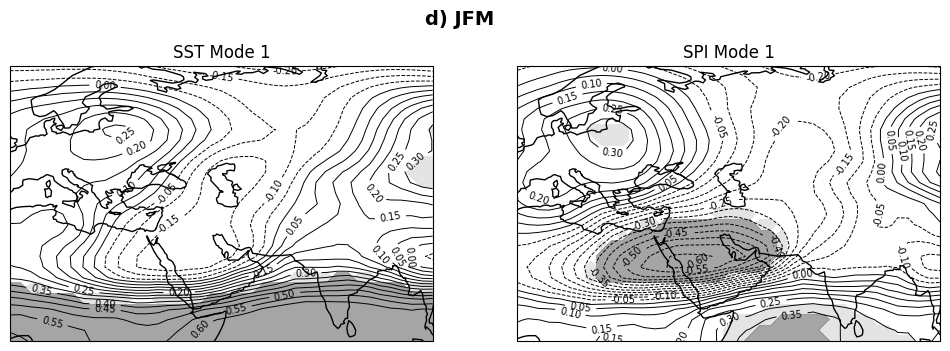

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


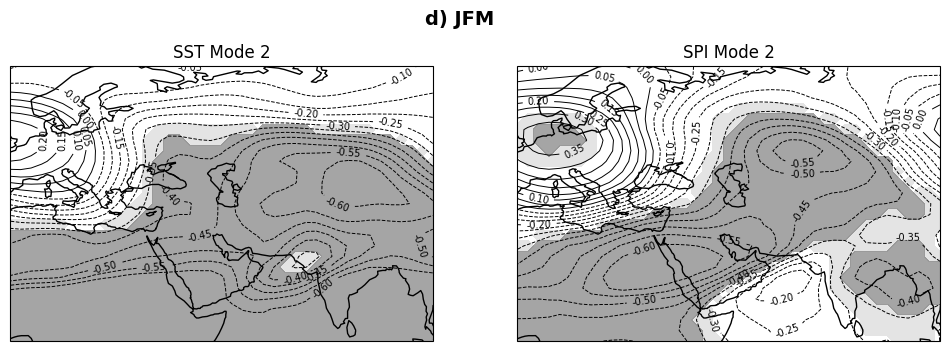

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


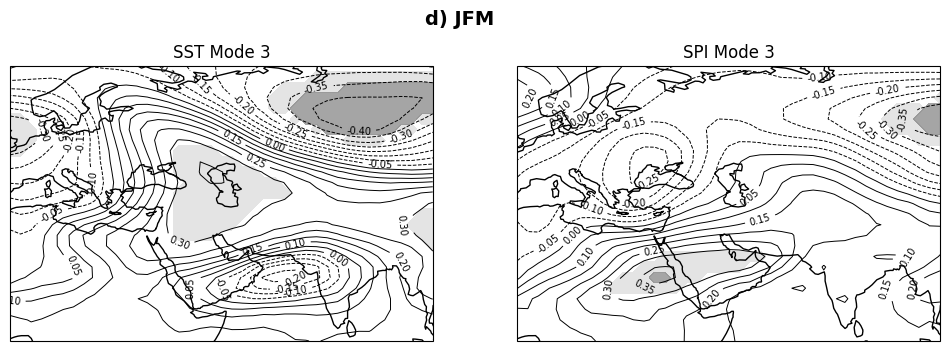

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


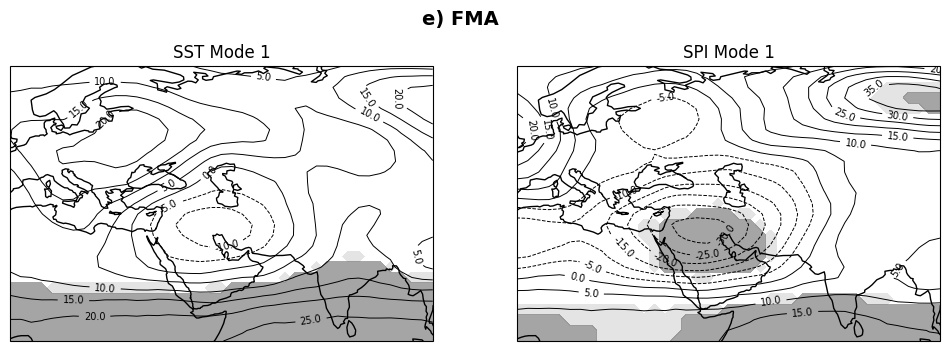

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


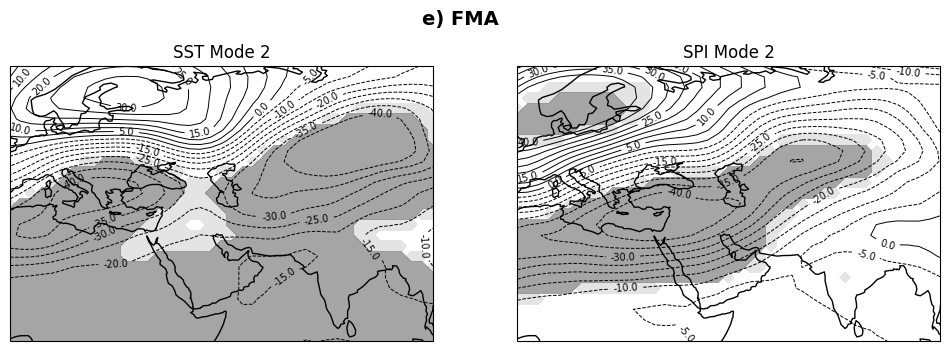

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


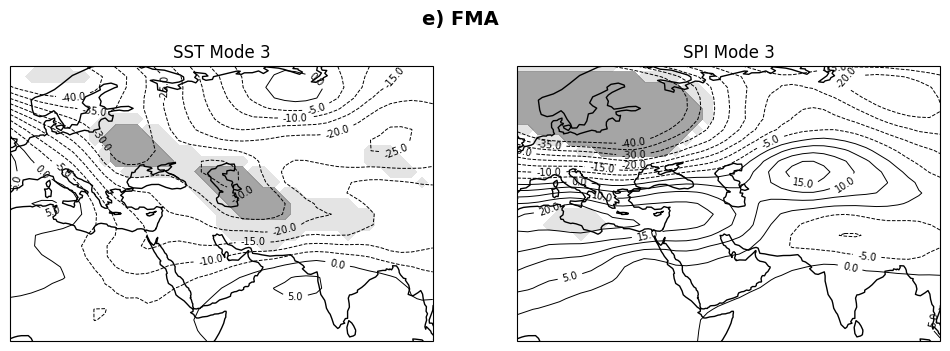

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


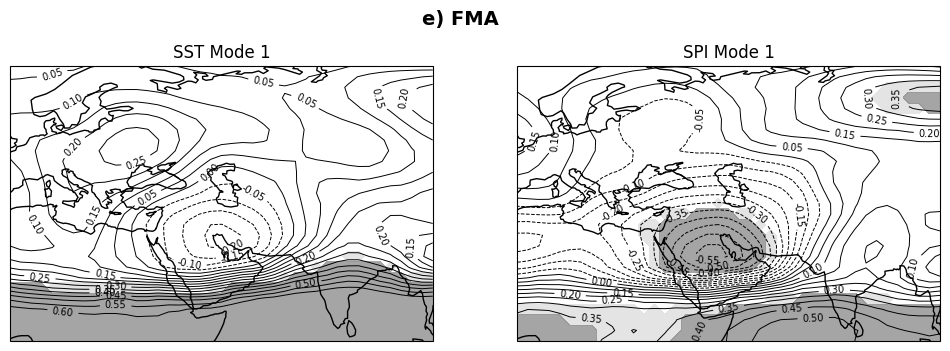

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


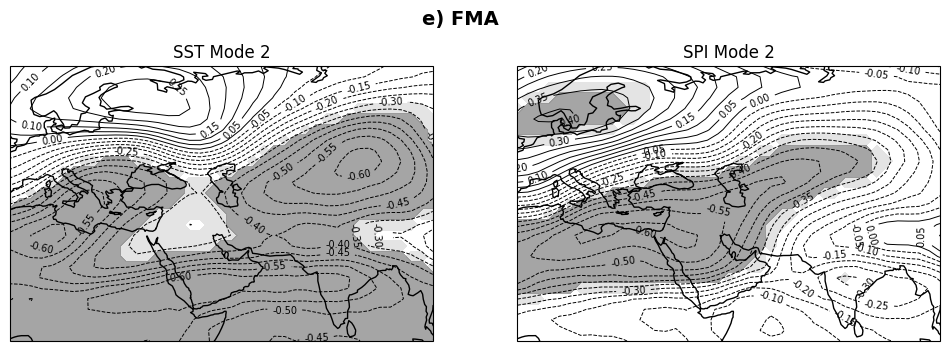

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


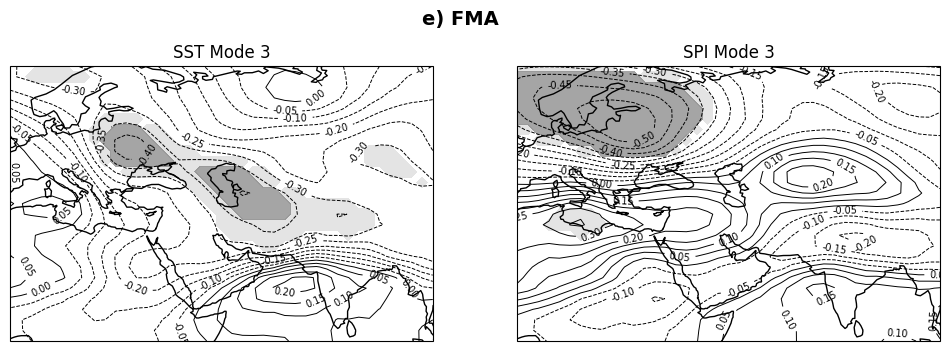

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


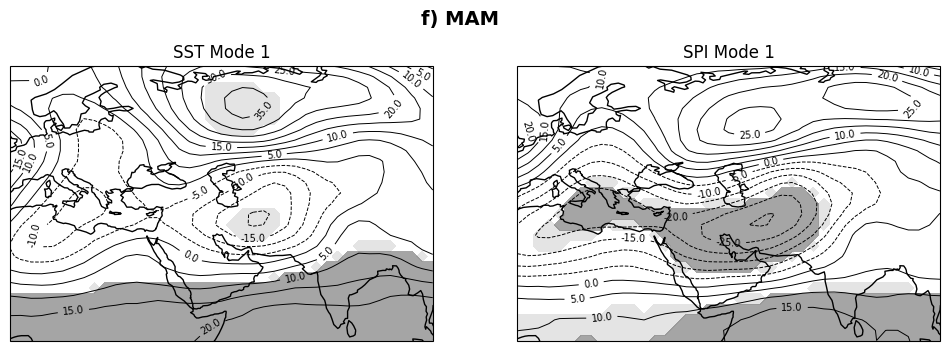

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


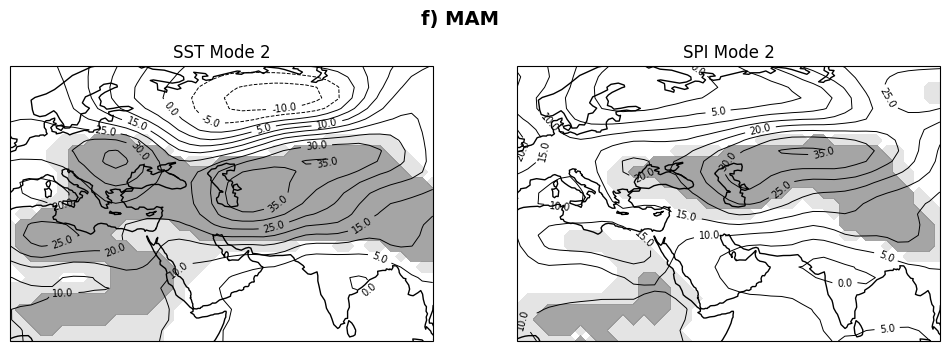

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


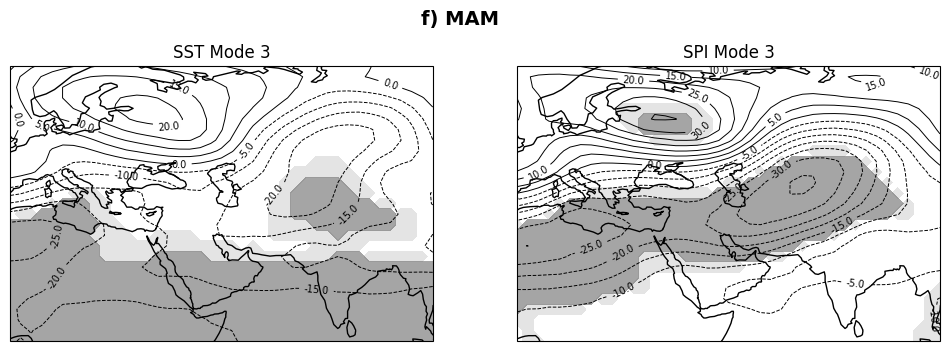

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


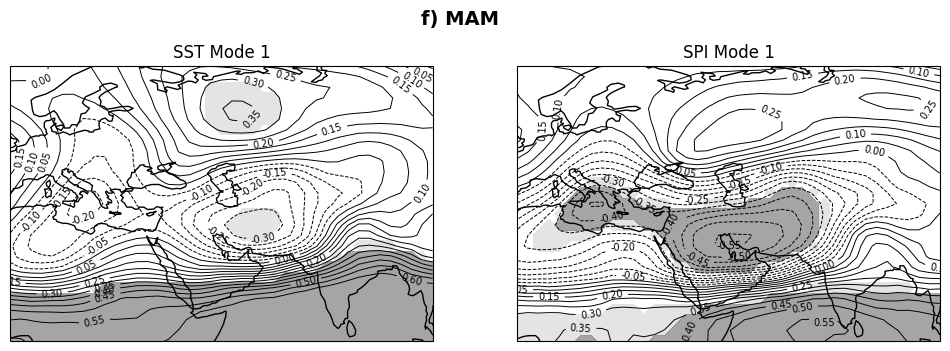

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


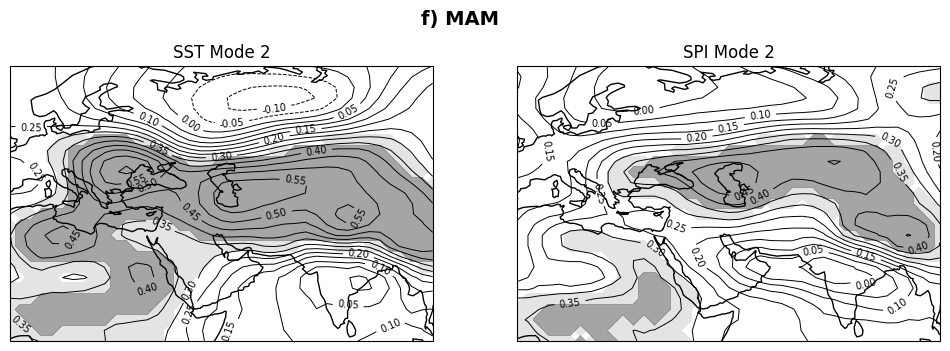

C:\Users\emile\AppData\Local\Temp\ipykernel_17584\3108464167.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('RdBu_r')


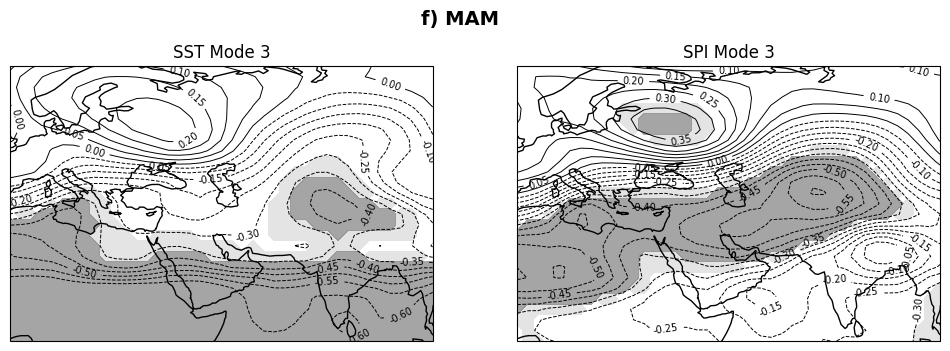

In [48]:
seasons = ['OND', 'NDJ', 'DJF', 'JFM', 'FMA', 'MAM']
labels = ['a)', 'b)', 'c)', 'd)', 'e)', 'f)']
for season, label in zip(seasons, labels):
    svd_regression_gph(sst = sst.sst3m, spi=spi, hpa=gph.hgt3m,label=label,
                       detrend=False,norm_preds=True,
                       method='reg',
                       n_modes=3, month=season,proj=ccrs.PlateCarree())
    svd_regression_gph(sst = sst.sst3m, spi=spi, hpa=gph.hgt3m,label=label,
                       detrend=False, norm_preds=True,
                       method='corr',
                       n_modes=3, month=season,proj=ccrs.PlateCarree())

# Empirical Hindcast

In [ ]:
def svd_regression_correlation_maps(
    spi, sst, slp, n_modes=1, detrend=False, month=None,
    model=None, param_grid=None, proj=ccrs.PlateCarree(),
    threshold=0.37, region_mask=None
):
    # === Filter by month if needed ===
    if month is not None:
        months = ['NDJ', 'DJF', 'JFM', 'FMA', 'MAM', 'AMJ',
                  'MJJ', 'JJA', 'JAS', 'ASO', 'SON', 'OND']
        month_num = months.index(month) + 1
        sst = sst.sel(time=sst['time.month'] == month_num)
        slp = slp.sel(time=slp['time.month'] == month_num)
        spi = spi.sel(time=spi['time.month'] == month_num)

    # Mask for NaNs in the first timestep
    spi_mask = spi.isel(time=0).notnull().values

    # === Helper: detrending ===
    def xr_detrend(da):
        return xr.apply_ufunc(
            scipy_detrend, da, input_core_dims=[['time']],
            output_core_dims=[['time']], vectorize=True,
            dask='parallelized', output_dtypes=[da.dtype]
        )

    # === Helper: extract PC1 ===
    def get_pc1(X, Y):
        if detrend:
            X = xr_detrend(X.fillna(0)).transpose('time', 'lat', 'lon')
            Y = xr_detrend(Y.fillna(0)).transpose('time', 'lat', 'lon')
        X = (X - X.mean('time')) / (X.std('time') + 1e-6)
        Y = (Y - Y.mean('time')) / (Y.std('time') + 1e-6)

        mca = xMCA(X.fillna(0), Y.fillna(0))
        mca.apply_coslat()
        mca.solve()
        return mca.pcs()['left'].sel(mode=n_modes)

    # Align period
    period = slice('1991-01-01', '2020-12-31')
    spi = spi.sel(time=period).transpose('time', 'lat', 'lon')
    sst = sst.sel(time=period).transpose('time', 'lat', 'lon')
    slp = slp.sel(time=period).transpose('time', 'lat', 'lon')

    # Extract PC1 series
    pc1_sst = get_pc1(sst, spi).values
    pc1_slp = get_pc1(slp, spi).values

    # === Custom CV correlation function ===
    def cv_correlation(y):
        if np.isnan(y).all() or np.sum(~np.isnan(y)) < 10:
            return np.nan

        mask = ~np.isnan(y)
        y_clean = y[mask]
        X = np.stack([pc1_sst[mask], pc1_slp[mask]], axis=-1)

        kf = KFold(n_splits=3, shuffle=True, random_state=0)

        if param_grid is not None:
            scorer = make_scorer(lambda yt, yp: pearsonr(yt, yp)[0],
                                 greater_is_better=True)
            grid = GridSearchCV(model, param_grid, cv=kf, scoring=scorer)
            grid.fit(X, y_clean)
            return grid.best_score_
        else:
            corrs = []
            for train_idx, test_idx in kf.split(X):
                m = clone(model)
                m.fit(X[train_idx], y_clean[train_idx])
                y_pred = m.predict(X[test_idx])
                r, _ = pearsonr(y_clean[test_idx], y_pred)
                corrs.append(r)
            return np.mean(corrs) if corrs else np.nan

    # Vectorized application
    cv_score = xr.apply_ufunc(
        cv_correlation,
        spi,
        input_core_dims=[["time"]],
        vectorize=True,
        dask="parallelized",
        output_dtypes=[float],
    )

    # Convert to DataArray & mask
    r_map = xr.DataArray(cv_score, coords=[spi.lat, spi.lon], dims=['lat', 'lon'])
    r_map = r_map.where(spi_mask)
    if region_mask is not None:
        r_map = r_map.where(region_mask == 0, np.nan)

    # === Plotting ===
    levels = np.arange(-1, 1.1, 0.1)
    fig, ax = plt.subplots(1, 1, figsize=(8, 5), subplot_kw={'projection': proj})

    rdblu = cm.get_cmap('RdBu_r').copy()
    rdblu.set_bad(color='white', alpha=0.45)

    r_map.plot(
        vmin=-1, vmax=1, cmap=rdblu, ax=ax,
        cbar_kwargs={'orientation': 'vertical', 'pad': 0.03, 'shrink': 0.8, 'label': ''},
        add_colorbar=True, levels=levels, transform=ccrs.PlateCarree()
    )
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.set_title(f"{month}", fontsize=14, fontweight='bold')

    mask = r_map > threshold
    lon2d, lat2d = np.meshgrid(r_map.lon.values, r_map.lat.values)
    ax.scatter(lon2d[mask], lat2d[mask], color='black', s=10,
               transform=ccrs.PlateCarree(), label=f'Corr > {threshold}')
    ax.legend(loc='lower right', fontsize=9)

    plt.tight_layout()
    if param_grid is None:
        plt.savefig(f'figures/hindcast/STATLR_{month}_corr.pdf', dpi=150)
    else:
        plt.savefig(f'figures/hindcast/STATML_{month}_corr.pdf', dpi=150)
    plt.show()

    return r_map


## OLS

C:\Users\emile\AppData\Local\Temp\ipykernel_2976\769403088.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rdblu = cm.get_cmap('RdBu_r').copy()


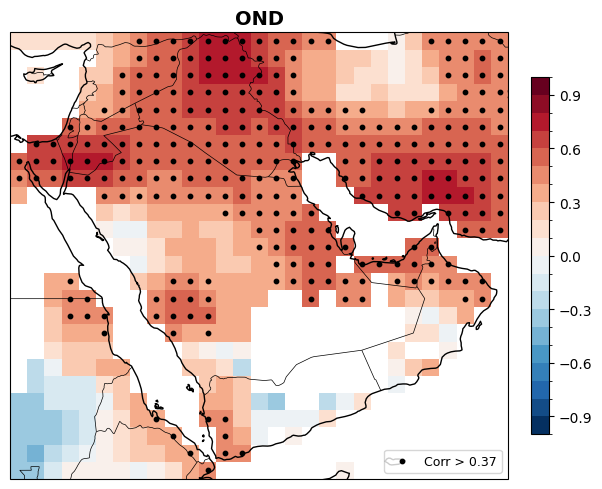

C:\Users\emile\AppData\Local\Temp\ipykernel_2976\769403088.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rdblu = cm.get_cmap('RdBu_r').copy()


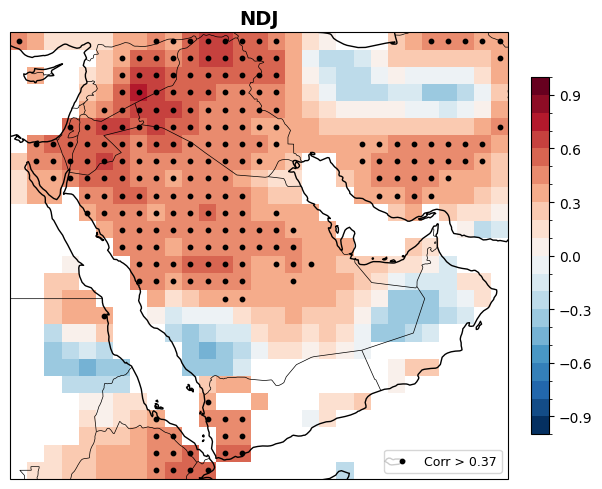

C:\Users\emile\AppData\Local\Temp\ipykernel_2976\769403088.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rdblu = cm.get_cmap('RdBu_r').copy()


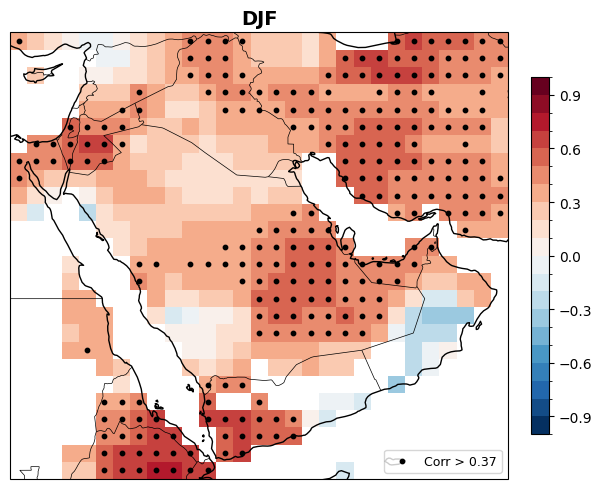

C:\Users\emile\AppData\Local\Temp\ipykernel_2976\769403088.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rdblu = cm.get_cmap('RdBu_r').copy()


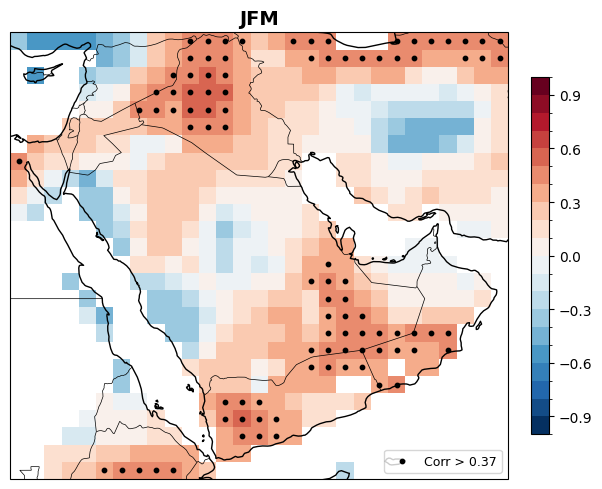

C:\Users\emile\AppData\Local\Temp\ipykernel_2976\769403088.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rdblu = cm.get_cmap('RdBu_r').copy()


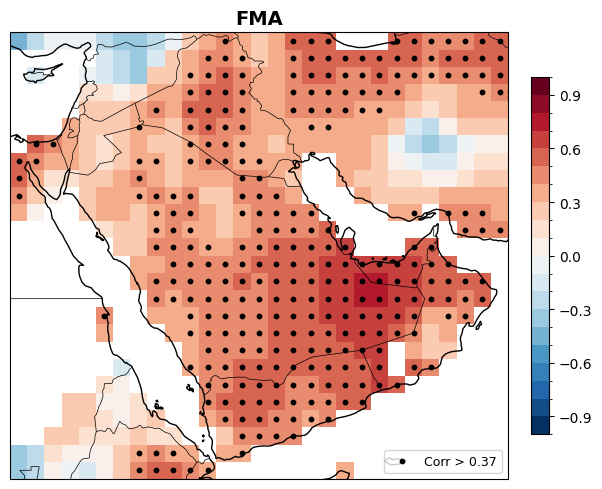

C:\Users\emile\AppData\Local\Temp\ipykernel_2976\769403088.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rdblu = cm.get_cmap('RdBu_r').copy()


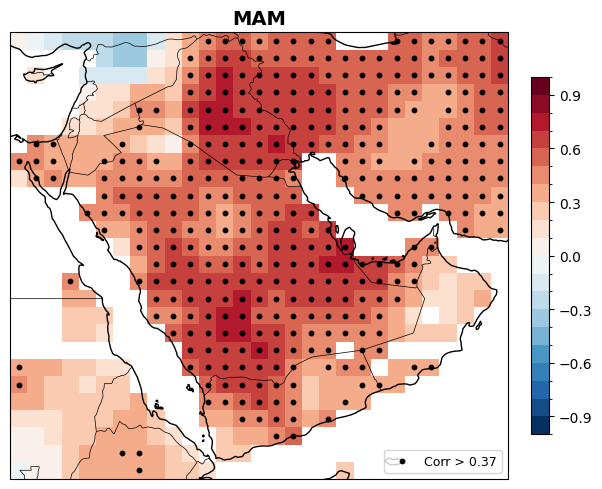

In [ ]:

corrmap_stat = {}
mask = regionmask.defined_regions.natural_earth_v5_0_0.land_110.mask(lon_or_obj=spi.lon,
    lat = spi.lat
)
for month in ['OND', 'NDJ', 'DJF', 'JFM', 'FMA', 'MAM']:

    r_map = svd_regression_correlation_maps(
        spi=spi,
        sst=sst.sst3m,
        slp=slp.slp3m,
        month=month,
        n_modes=1,
        model = LinearRegression(),
        detrend=True,
        region_mask=mask
    )
    corrmap_stat[month] = r_map

## ML

C:\Users\emile\AppData\Local\Temp\ipykernel_2976\769403088.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rdblu = cm.get_cmap('RdBu_r').copy()


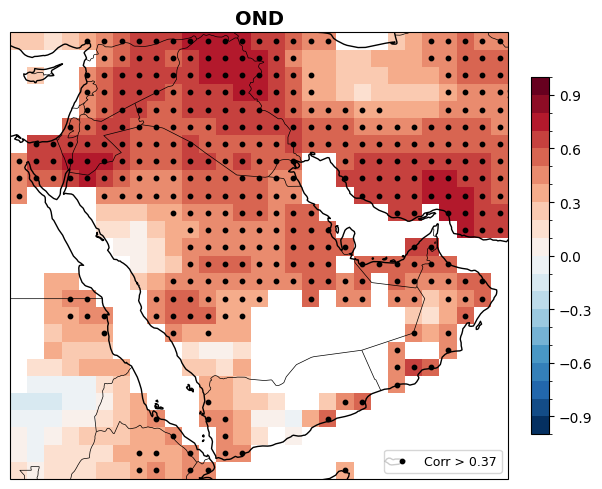

C:\Users\emile\AppData\Local\Temp\ipykernel_2976\769403088.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rdblu = cm.get_cmap('RdBu_r').copy()


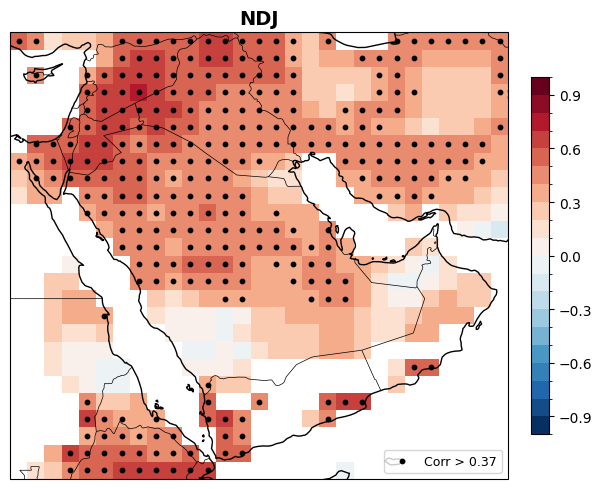

C:\Users\emile\AppData\Local\Temp\ipykernel_2976\769403088.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rdblu = cm.get_cmap('RdBu_r').copy()


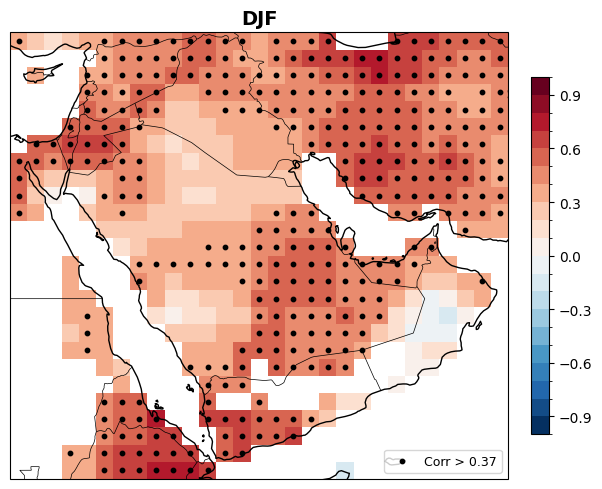

C:\Users\emile\AppData\Local\Temp\ipykernel_2976\769403088.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rdblu = cm.get_cmap('RdBu_r').copy()


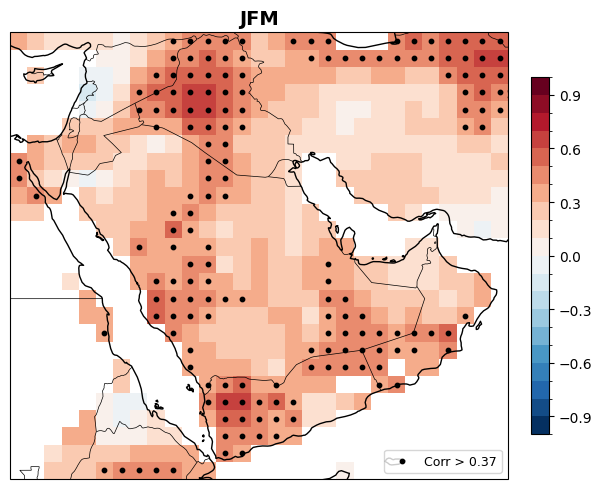

C:\Users\emile\AppData\Local\Temp\ipykernel_2976\769403088.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rdblu = cm.get_cmap('RdBu_r').copy()


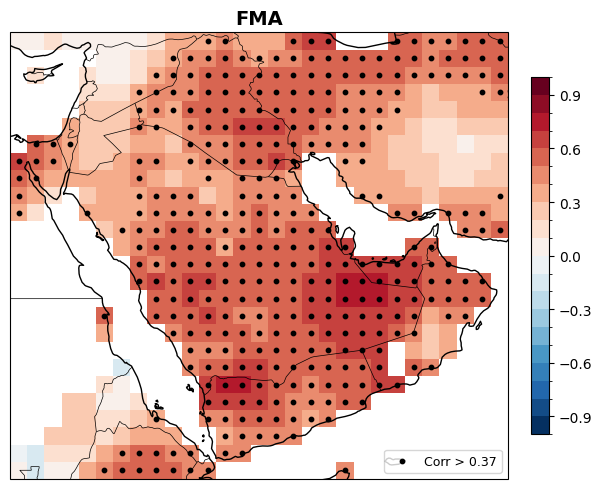

C:\Users\emile\AppData\Local\Temp\ipykernel_2976\769403088.py:96: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rdblu = cm.get_cmap('RdBu_r').copy()


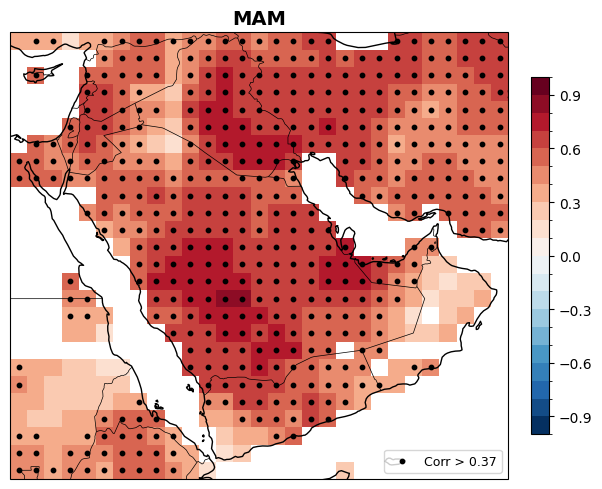

In [ ]:
from sklearn.kernel_ridge import KernelRidge
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor

# Parameter grid for small-sample Kernel Ridge
param_grid = {
    "alpha": [0.001, 0.01, 0.1, 1],          # regularization strength
    "kernel": ["linear", "rbf"],
    "gamma": [0.01, 0.1, 1]                  # only relevant for RBF
}

corrmap_stat_ML = {}
mask = regionmask.defined_regions.natural_earth_v5_0_0.land_110.mask(
    lon_or_obj=spi.lon,
    lat=spi.lat
)

for month in ['OND', 'NDJ', 'DJF', 'JFM', 'FMA', 'MAM']:
    r_map = svd_regression_correlation_maps(
        spi=spi,
        sst=sst.sst3m,
        slp=slp.slp3m,
        month=month,
        n_modes=1,
        model=KernelRidge(),
        param_grid=param_grid,
        detrend=True,
        region_mask=mask
    )
    corrmap_stat_ML[month] = r_map

## With Leads

In [ ]:
# def svd_regression_correlation_maps(spi, sst, slp, n_modes=1, detrend=False, month=None, model=LinearRegression(),
#                                     region_mask = None,
#                                      proj=ccrs.PlateCarree(), threshold=0.37, lead_time=0.5, cv=3):
    
#     def get_center_month(month):
#         months = ['NDJ', 'DJF', 'JFM', 'FMA', 'MAM', 'AMJ',
#                   'MJJ', 'JJA', 'JAS', 'ASO', 'SON', 'OND']
#         return months.index(month) + 1  # 1-indexed

#     def shift_season(season_month, shift):
#         shift = int(np.floor(shift))
#         return (season_month - shift - 1) % 12 + 1  # ensures 1-12

#     def select_by_month(ds, month):
#         return ds.sel(time=ds['time.month'] == month)

#     def get_pc1(X, Y):
#         if detrend:
#             def xr_detrend(da):
#                 return xr.apply_ufunc(
#                     scipy_detrend, da, input_core_dims=[['time']],
#                     output_core_dims=[['time']], vectorize=True,
#                     dask='parallelized', output_dtypes=[da.dtype])
#             X = xr_detrend(X.fillna(0))
#             Y = xr_detrend(Y.fillna(0))

#         X = X.transpose('time', 'lat', 'lon')
#         Y = Y.transpose('time', 'lat', 'lon')

#         X = (X - X.mean('time')) / (X.std('time') + 1e-6)
#         Y = (Y - Y.mean('time')) / (Y.std('time') + 1e-6)

#         mca = xMCA(X.fillna(0), Y.fillna(0))
#         mca.apply_coslat()
#         mca.solve()

#         return mca.pcs()['left'].sel(mode=n_modes)

#     # === Temporal alignment ===
#     target_month = get_center_month(month)
#     predictor_month = shift_season(target_month, lead_time)


#     spi = spi.sel(time=slice('1991-01-01', '2020-12-31')).transpose('time', 'lat', 'lon')
#     sst = sst.sel(time=slice('1991-01-01', '2020-12-31')).transpose('time', 'lat', 'lon')
#     slp = slp.sel(time=slice('1991-01-01', '2020-12-31')).transpose('time', 'lat', 'lon')

#     spi = select_by_month(spi, target_month)
#     sst = select_by_month(sst, predictor_month)
#     slp = select_by_month(slp, predictor_month)


#     # Restrict to common time window
#     #common_time = np.intersect1d(np.intersect1d(spi.time.values, sst.time.values), slp.time.values)
#     #print(f"Common time period: {common_time}")
#     spi = spi.transpose('time', 'lat', 'lon')
#     sst = sst.transpose('time', 'lat', 'lon')
#     slp = slp.transpose('time', 'lat', 'lon')

#     #remove first time step of spi and last time step of sst and slp 
#     if lead_time > 0.5 and target_month < predictor_month:
#         spi = spi.isel(time=slice(1, None))
#         sst = sst.isel(time=slice(None, -1))
#         slp = slp.isel(time=slice(None, -1))


#     print(spi.time.values[0], sst.time.values[0], slp.time.values[0])

#     # === MCA regression ===
#     pc1_sst = get_pc1(sst, spi)
#     pc1_slp = get_pc1(slp, spi)

#     lat = spi.lat
#     lon = spi.lon
#     cv_score = xr.full_like(spi.isel(time=0), np.nan)  # 2D map

#     kf = KFold(n_splits=3, shuffle=True, random_state=0)

#     def cv_correlation(y, pc1_sst, pc1_slp, model, kf):
#         if np.isnan(y).all() or np.sum(~np.isnan(y)) < 10:
#             return np.nan

#         mask = ~np.isnan(y)
#         y_clean = y[mask]
#         X = np.stack([pc1_sst[mask], pc1_slp[mask]], axis=-1)

#         corrs = []
#         for train_idx, test_idx in kf.split(X):
#             model.fit(X[train_idx], y_clean[train_idx])
#             y_pred = model.predict(X[test_idx])
#             r, _ = pearsonr(y_clean[test_idx], y_pred)
#             corrs.append(r)
#         return np.mean(corrs) if corrs else np.nan

#     def wrapped_cv(y):
#         return cv_correlation(y, pc1_sst.values, pc1_slp.values, model, kf)


#     cv_score = xr.apply_ufunc(
#         wrapped_cv,
#         spi,
#         input_core_dims=[["time"]],
#         vectorize=True,
#         dask="parallelized",
#         output_dtypes=[float],
#     )

#     r_map = xr.DataArray(cv_score, coords=[lat, lon], dims=['lat', 'lon'])
#     r_map = r_map.where(spi.isel(time=0).notnull())
#     if regionmask is not None:
#         r_map = r_map.where(region_mask==0, np.nan)

#     # === Plotting ===
#     levels = np.arange(-1, 1.1, 0.1)
#     fig, ax = plt.subplots(1, 1, figsize=(8, 5), subplot_kw={'projection': proj})

#     r_map.plot(
#         vmin=-1, vmax=1, cmap='RdBu_r', levels=levels,
#         cbar_kwargs={'label': 'Correlation (CV)'}, ax=ax,
#         transform=ccrs.PlateCarree()
#     )
#     ax.coastlines()
#     ax.add_feature(cfeature.BORDERS, linewidth=0.5)
#     ax.set_title(f"{month} - Lead: {lead_time} month(s) (CV={cv})", fontsize=14)

#     # Scatter significant correlation points
#     mask = r_map > threshold
#     lon2d, lat2d = np.meshgrid(r_map.lon.values, r_map.lat.values)
#     ax.scatter(
#         lon2d[mask], lat2d[mask],
#         color='black', s=10, transform=ccrs.PlateCarree(),
#         label=f'Corr > {threshold}'
#     )
#     ax.legend(loc='lower right', fontsize=9)
#     plt.tight_layout()
#     plt.show()

#     return r_map

# Comparison with Dynamical Hindcast

In [ ]:
# --- Load Data ---

spi_multimodel = xr.open_dataset('data/spi_hindcast_multimodel.nc').spi

#rename dimensions to match the SPI data
spi_multimodel = spi_multimodel.rename({'X': 'lon', 'Y': 'lat', 'S': 'S'})


# --- Create Global Land Mask (based on grid of multimodel as reference) ---
mask = regionmask.defined_regions.natural_earth_v5_0_0.land_110.mask(
    spi_multimodel.lon, spi_multimodel.lat
)


spi_multimodel = spi_multimodel.where(mask == 0, np.nan)



In [ ]:
corrmap_dyn = {}

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

seasons = ['NDJ', 'DJF', 'JFM', 'FMA', 'MAM', 'AMJ', 
           'MJJ', 'JJA', 'JAS', 'ASO', 'SON', 'OND']

# --- Loop over start months and lead times ---
for s_month in range(1, 13):  # Start months
    for lead_int in range(0, 6):  # For lead times 0,1,2,3,4 => 0.5 to 4.5
        lead_time = int(lead_int)  # floor
        lead = lead_time + 0.5     # fractional lead (matching model's lead index)

        # --- Target month ---
        t_month = (s_month + lead_time) % 12
        if t_month == 0:
            t_month = 12

        season_name = seasons[t_month - 1]  # Map target month to season

        # --- Get forecast SPI ---
        spi_fcst_mon = spi_multimodel.sel(S=spi_multimodel['S.month'] == s_month).isel(L=lead_time).drop_vars('L')

        # --- Shift forecast to target time ---
        S_values = spi_fcst_mon['S'].values
        T_values = [S_value + pd.DateOffset(months=lead_time) for S_value in S_values]
        spi_fcst_mon['S'] = T_values
        spi_fcst_mon = spi_fcst_mon.rename({'S': 'time'}).transpose('time', 'lat', 'lon')
        spi = spi.transpose('time', 'lat', 'lon')
        spi_fcst_mon = spi_fcst_mon.sel(time=slice('1991-01-01', '2020-12-31'))
        spi_obs_mon = spi.sel(time=spi_fcst_mon['time'])

        # --- Compute correlation ---
        corr = xr.corr(spi_fcst_mon, spi_obs_mon, dim='time')

        # --- Store ---
        if season_name not in corrmap_dyn:
            corrmap_dyn[season_name] = {}

        corrmap_dyn[season_name][lead] = corr

c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\emile\anaconda3\envs\ap-drought\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, 

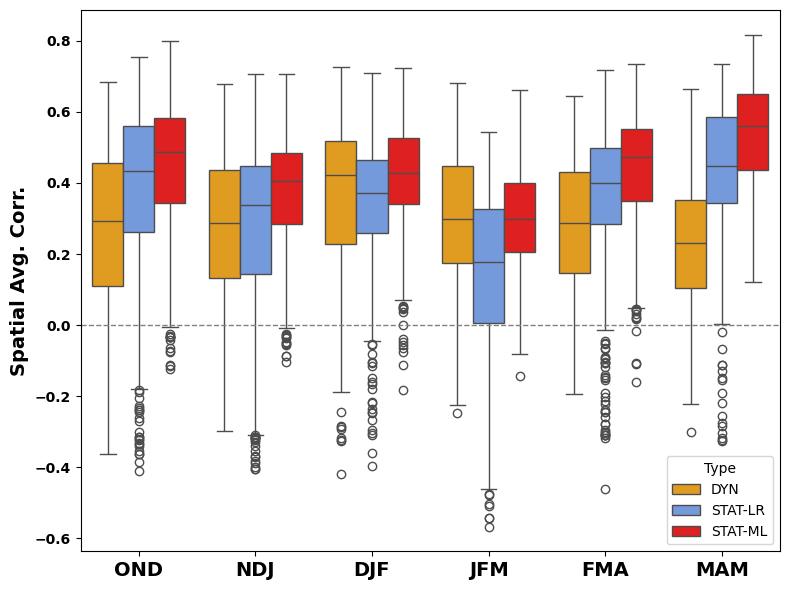

In [ ]:
df_list = []

for season in corrmap_stat.keys():
    lead_time = 2.5
    # Flatten the spatial correlation maps and drop NaNs
    dyn_values = corrmap_dyn[season][lead_time].values.flatten()
    stat_values = corrmap_stat[season].values.flatten()
    statML_values = corrmap_stat_ML[season].values.flatten()

    dyn_values = dyn_values[~np.isnan(dyn_values)]
    stat_values = stat_values[~np.isnan(stat_values)]
    statML_values = statML_values[~np.isnan(statML_values)]

    # Create dataframe for each and label
    df_dyn = pd.DataFrame({
        'Correlation': dyn_values,
        'Season': season,
        'Type': 'DYN'
    })

    df_stat = pd.DataFrame({
        'Correlation': stat_values,
        'Season': season,
        'Type': 'STAT-LR'
    })

    df_ML = pd.DataFrame({
        'Correlation': statML_values,
        'Season': season,
        'Type': 'STAT-ML'
    })

    df_list.extend([df_dyn, df_stat, df_ML])

# Combine all into one dataframe
df_all = pd.concat(df_list, ignore_index=True)

# Sort seasons if needed
season_order = ['OND', 'NDJ', 'DJF', 'JFM', 'FMA', 'MAM']
df_all['Season'] = pd.Categorical(df_all['Season'], categories=season_order, ordered=True)
df_all = df_all.sort_values('Season')

# Plot


plt.figure(figsize=(8, 6))
# Custom colors for the hue categories
custom_palette = {
    'DYN': 'orange',
    'STAT-LR': 'cornflowerblue',
    'STAT-ML': 'red'
}
sns.boxplot(
    data=df_all,
    x='Season',
    y='Correlation',
    hue='Type',
    hue_order=['DYN','STAT-LR','STAT-ML'],
    palette=custom_palette
)
plt.axhline(0, color='gray', linestyle='--', linewidth=1)
plt.xticks(fontsize=14, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')
plt.xlabel('')
plt.ylabel('Spatial Avg. Corr.', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig('figures/hindcast/comp_stat_dyn.pdf', dpi=150)
plt.show()